In [1]:
!python3.11 -m pip install ndlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.2/110.2 kB 1.7 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 16.2 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 17.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.9/840.9 kB 11.6 MB/s eta 0:00:0000:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.1/133.1 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 187.9/187.9 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 16.7 MB/s eta 0:00:00a 0:00:01m
  Created wheel for future: filename=future-0.18.3-py3-none-any.whl size=492024 sha256=5bbc300f8fac13d4379f6fc9a8bc02bdefcaded630dee87335ed55fca6a678d3
  Stored in directory: /User

In [14]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import ndlib.models.epidemics as ep
import pandas as pd
import scipy.integrate as igr
import pandas as pd

from numba import jit, typed # Use JIT to optimize runtime, since otherwise is very slow
from tqdm.notebook import tqdm, trange

# Assignment 2: Part 1

First we write a individual based simulation. It is based on the DES algorithm.

In [15]:
# SIR simulation model, note used frequency dependent model
@jit(nopython=True)
def generate_exponential(rate: float) -> float:
    """Generates random simulation from an exponential distribution

    Args:
        rate (float): Rate of exponential distribution events

    Returns:
        float: Random exponential point
    """
    return -np.log(np.random.random()) / rate

# Use numba for extra speed, cause otherwise it is slow
# Numba achieves a speedup of 10.000x, thus it is very useful
@jit(nopython=True, cache=True)
def simulation_iteration(X: int, Y: int, Z: int, b_0: float, b_1: float, omega: float, gamma: float, mu: float, t: float) -> tuple[float, int, int, int]:
    """Generate next iteration in DES simulation, based on the Direct simulation method

    Args:
        X (int): Suseptibles
        Y (int): Infecteds
        Z (int): Recovereds
        b_0 (float): rate of infection
        b_1 (float): Effect of season for seasonal forcing.
        omega (float): If seasonal forcing, duration of season.
        gamma (float): rate of recovery
        mu (float): birth/death rate
        t (float): current time
    """
    N = X + Y + Z
    rate_births = N * mu
    rate_transmission = b_0 * (1 + b_1 * np.cos(omega*t)) * X * Y / N
    rate_recovery = gamma * Y
    rate_death_suseptible = X * mu
    rate_death_infected = Y * mu
    rate_death_recovered = Z * mu

    rate_total = rate_births + rate_transmission + rate_recovery + rate_death_suseptible + rate_death_infected + rate_death_recovered
    delta_t = generate_exponential(rate_total)
    t_new = t + delta_t
    u = np.random.random()

    # Note this implementation is fairly ugly, but this can get optimized by the JIT compiler, thus making it the most efficient
    # It uses a property of the poisson distribution to just use two random numbers, which is much faster than the first reaction method
    if u < rate_births/rate_total:
        X += 1
    elif u < (rate_births + rate_transmission)/rate_total:
        X -= 1
        Y += 1
    elif u < (rate_births + rate_transmission + rate_recovery)/rate_total:
        Y -= 1
        Z += 1
    elif u < (rate_births + rate_transmission + rate_recovery + rate_death_suseptible)/rate_total:
        X -= 1
    elif u < (rate_births + rate_transmission + rate_recovery + rate_death_suseptible + rate_death_infected)/rate_total:
        Y -= 1
    else:
        Z -= 1

    return t_new, delta_t, X, Y, Z

def get_statistics(array_log: np.ndarray, T_max: int):
    """Return mean, last result and covariance"""
    # Note covariance statistics are weighed according to their delta t
    return array_log[:, 1] @ array_log[:, [2, 3, 4]]/T_max, array_log[-1], np.cov(array_log[:, 2], array_log[:, 3], aweights=array_log[:, 1])[1,0]

@jit(nopython=True, cache=True)
def event_based_simulation(X_0: int, Y_0: int, Z_0: int, b_0: float, gamma: float, mu: float, T_max: float, b_1: float = 0.0, omega: float = 0.0):
    # Set basic variables
    t = 0
    X, Y, Z = X_0, Y_0, Z_0
    
    # Create a list that stores all the states
    log_list = [(t, 0, X, Y, Z)]
    
    while t < T_max:
        # Iterate over the next state
        t, delta_t, X, Y, Z = simulation_iteration(X, Y, Z, b_0, b_1, omega, gamma, mu, t)
        
        # Store new result
        log_list.append((t, delta_t, X, Y, Z))

        # Stop early if done
        if X + Y + Z == 0:
            break

    # Convert to array and shift delta t one up, to calculate mean
    array_log = np.array(log_list)
    array_log[:-1, 1] = array_log[1:, 1] 
    array_log[-1, 1] = 0
    
    return array_log

In [16]:
# Run this to ensure that is precompiled
event_based_simulation(10, 10, 0, 1.6, 0.2, 0.05, 10)

array([[0.00000000e+00, 7.04088940e-01, 1.00000000e+01, 1.00000000e+01,
        0.00000000e+00],
       [7.04088940e-01, 3.60838287e-02, 9.00000000e+00, 1.10000000e+01,
        0.00000000e+00],
       [7.40172769e-01, 1.42668257e-01, 8.00000000e+00, 1.20000000e+01,
        0.00000000e+00],
       [8.82841026e-01, 2.19703632e-01, 9.00000000e+00, 1.20000000e+01,
        0.00000000e+00],
       [1.10254466e+00, 4.71302926e-02, 8.00000000e+00, 1.20000000e+01,
        0.00000000e+00],
       [1.14967495e+00, 4.01710063e-02, 7.00000000e+00, 1.30000000e+01,
        0.00000000e+00],
       [1.18984596e+00, 9.63374092e-02, 7.00000000e+00, 1.20000000e+01,
        1.00000000e+00],
       [1.28618337e+00, 1.19234033e-01, 8.00000000e+00, 1.20000000e+01,
        1.00000000e+00],
       [1.40541740e+00, 4.25768245e-02, 7.00000000e+00, 1.20000000e+01,
        1.00000000e+00],
       [1.44799422e+00, 1.14976018e-01, 6.00000000e+00, 1.30000000e+01,
        1.00000000e+00],
       [1.56297024e+00, 6.7676

In [17]:
def run_simulation_and_graph(t_start: float, t_end: float, initial_infection: float, N: int, b_0: float, gamma: float, mu: float, title: str = "SIR model of disease that becomes endemic", b_1: float = 0.0, omega: float = 0.0):
    sim_res = event_based_simulation((1 - initial_infection) * N, initial_infection * N, 0, b_0, gamma, mu, t_end, b_1, omega)
    
    def sir_model(t: float, SIR: np.ndarray):
        S, I, R = SIR

        return np.array([
            mu - b_0 * (1 + b_1 * np.cos(omega*t))*S*I - mu * S,
            b_0 * (1 + b_1 * np.cos(omega*t))*S*I-gamma*I - mu * I,
            gamma*I - mu * R
        ])

    integrated_sir = igr.solve_ivp(sir_model, [t_start, t_end], np.array([1-initial_infection, initial_infection, 0]), t_eval=np.arange(t_start, t_end, 0.1))

    plt.plot(sim_res[:,0], sim_res[:, 2], label="S (simulated)")
    plt.plot(sim_res[:,0], sim_res[:, 3], label="I (simulated)")
    plt.plot(sim_res[:,0], sim_res[:, 4], label="R (simulated)")
    plt.plot(integrated_sir.t, integrated_sir.y[0] * N, label="S")
    plt.plot(integrated_sir.t, integrated_sir.y[1] * N, label="I")
    plt.plot(integrated_sir.t, integrated_sir.y[2] * N, label="R")
    plt.legend()
    plt.title(title)
    plt.xlabel("$t$")
    plt.ylabel("Fraction of population")
    plt.show()

    return sim_res

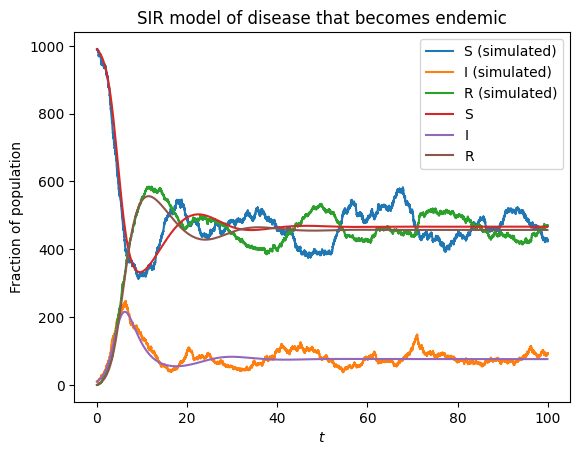

array([[0.00000000e+00, 3.45688472e-03, 9.90000000e+02, 1.00000000e+01,
        0.00000000e+00],
       [3.45688472e-03, 6.06518068e-03, 9.89000000e+02, 1.00000000e+01,
        0.00000000e+00],
       [9.52206539e-03, 1.25183947e-02, 9.90000000e+02, 1.00000000e+01,
        0.00000000e+00],
       ...,
       [9.99977044e+01, 4.58807858e-04, 4.25000000e+02, 9.30000000e+01,
        4.69000000e+02],
       [9.99981632e+01, 2.35689125e-03, 4.24000000e+02, 9.40000000e+01,
        4.69000000e+02],
       [1.00000520e+02, 0.00000000e+00, 4.25000000e+02, 9.40000000e+01,
        4.69000000e+02]])

In [18]:
t_start = 0
t_end = 100
initial_infection = 0.01
N = 1000
b_0 = 1.5
gamma = 0.6
mu = 0.1
# simulate((1 - initial_infection) * N, initial_infection * N, 0, beta, gamma, mu, t_end, ret_avg=True)
run_simulation_and_graph(t_start, t_end, initial_infection, N, b_0, gamma, mu)

Note: We can reduce the variablity by increasing the number of people in the simulation.

## Investigate Simulation Variability and Negative Co-variance
To determine the variance between runs, we'll run every simulation 50 times, with different parameter values.

In [19]:
# First the beta
N = 1000
n_sim_runs = 2500
t_start = 0
t_end = 100
initial_infection = 0.04
b_0 = 1.6
gamma = 0.2
mu = 0.05

betas = np.arange(1.1, 2.0, 0.025)
beta_end_values = np.zeros((len(betas), n_sim_runs, 3))
beta_mean = np.zeros((len(betas), n_sim_runs, 3))
beta_cov = np.zeros((len(betas), n_sim_runs))

for i, _beta in enumerate(tqdm(betas)):
    for j in range(n_sim_runs):
        result_statistics = get_statistics(event_based_simulation((1 - initial_infection) * N, initial_infection*N, 0, _beta, gamma, mu, t_end), t_end)
        beta_mean[i, j] = result_statistics[0]
        beta_end_values[i, j] = result_statistics[1][2:]
        beta_cov[i, j] = result_statistics[2]

  0%|          | 0/36 [00:00<?, ?it/s]

To compare the variance between the simulations, we're comparing variance of the simulated results at t = T_max of the given beta's. We are simulating n = 1000 simulations for beta in [1.1, 2.0], where all it is simulated for every 0.01. We can clearly see that the variance of the R compartment increases, and the variance of the I compartment says rather similar. The variance of the S compartment decreases.

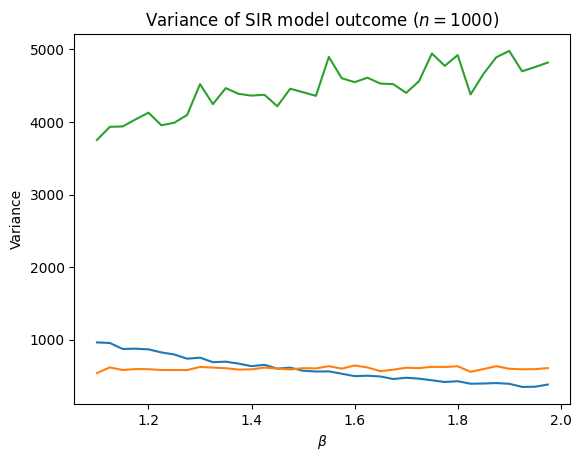

In [20]:
# res
def plot_variance_outcome(end_values: np.ndarray, param_values: np.ndarray, title: str, xlabel: str):
    res_var = end_values.var(axis=1)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel("Variance")
    plt.plot(param_values, res_var)
    plt.show()

plot_variance_outcome(beta_end_values, betas, "Variance of SIR model outcome ($n = 1000$)", "$\\beta$")

We can easily get the means of the simulations of the betas. We can clearly see that as beta increases, the disease spreads faster, thus there are less suseptibles and more that have recovered. 

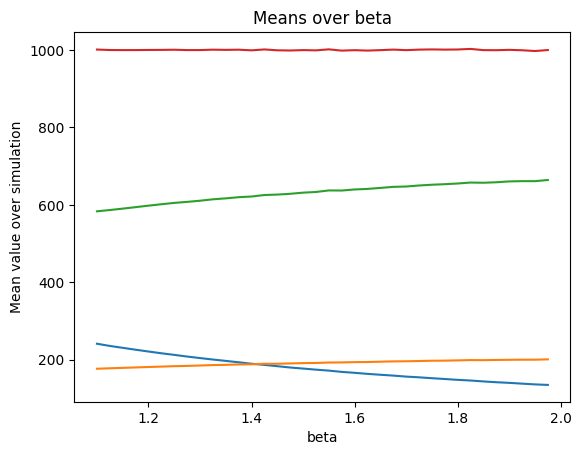

In [21]:
def plot_mean(mean_values: np.ndarray, param_values: np.ndarray, title: str, xlabel: str):
    res_avg_m = mean_values.mean(axis=1)
    plt.plot(param_values, res_avg_m)
    plt.plot(param_values, res_avg_m.sum(axis=1))
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel("Mean value over simulation")
    plt.show()

plot_mean(beta_mean, betas, "Means over beta", "beta")

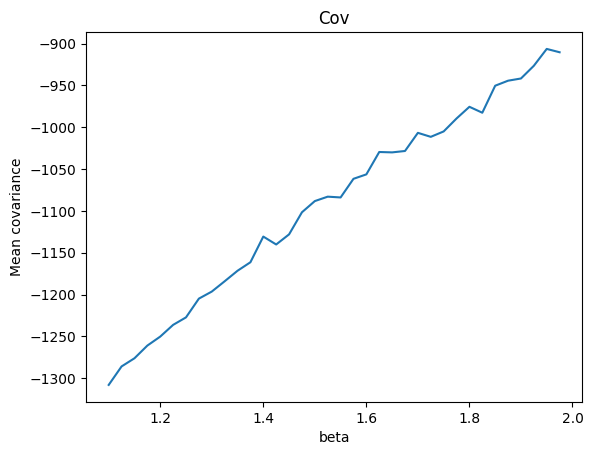

In [22]:
def plot_SI_cov(cov_values: np.ndarray, param_values: np.ndarray, title: str, xlabel: str):
    res_cov_m = cov_values.mean(axis=1)
    plt.plot(param_values, res_cov_m)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel("Mean covariance")
    plt.show()

plot_SI_cov(beta_cov, betas, "Cov", "beta")

In [23]:
gammas = np.arange(0.1, 1.6, 0.05)
gamma_end_values = np.zeros((len(gammas), n_sim_runs, 3))
gamma_mean = np.zeros((len(gammas), n_sim_runs, 3))
gamma_cov = np.zeros((len(gammas), n_sim_runs))

for i, _gamma in enumerate(tqdm(gammas)):
    for j in range(n_sim_runs):
        result_statistics = get_statistics(event_based_simulation((1 - initial_infection) * N, initial_infection*N, 0, b_0, _gamma, mu, t_end), t_end)
        gamma_mean[i, j] = result_statistics[0]
        gamma_end_values[i, j] = result_statistics[1][2:]
        gamma_cov[i, j] = result_statistics[2]

  0%|          | 0/30 [00:00<?, ?it/s]

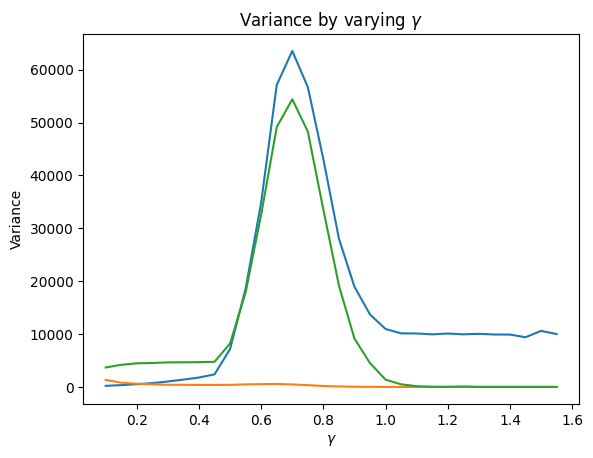

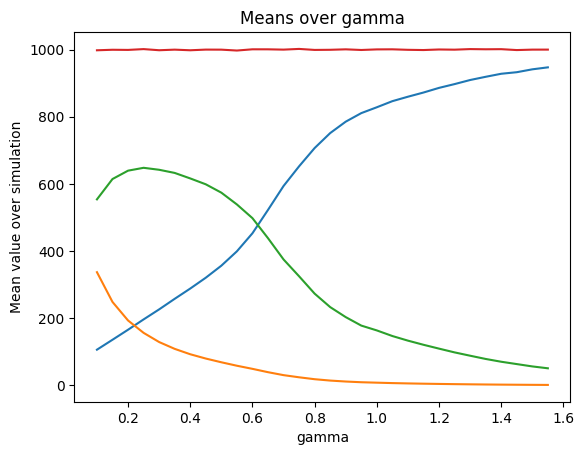

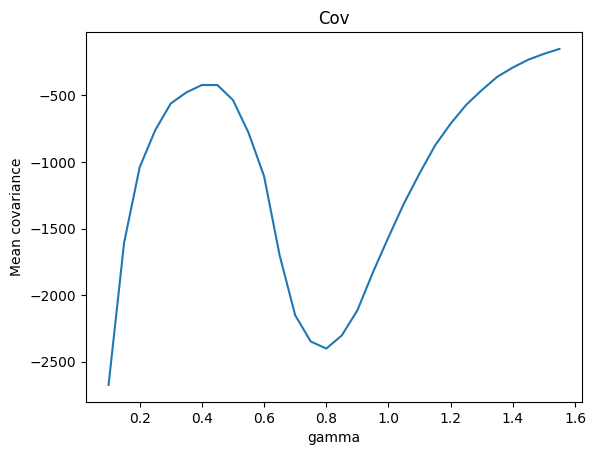

In [24]:
plot_variance_outcome(gamma_end_values, gammas, "Variance by varying $\\gamma$", "$\\gamma$")
plot_mean(gamma_mean, gammas, "Means over gamma", "gamma")
plot_SI_cov(gamma_cov, gammas, "Cov", "gamma")

In [25]:
mus = np.arange(0.01, 0.2, 0.01)
n_sim_runs_mu = 10000
mu_end_values = np.zeros((len(mus), n_sim_runs_mu, 3))
mu_mean = np.zeros((len(mus), n_sim_runs_mu, 3))
mu_cov = np.zeros((len(mus), n_sim_runs_mu))

for i, _mu in enumerate(tqdm(mus)):
    for j in range(n_sim_runs_mu):
        result_statistics = get_statistics(event_based_simulation((1 - initial_infection) * N, initial_infection*N, 0, b_0, gamma, _mu, t_end), t_end)
        mu_mean[i, j] = result_statistics[0]
        mu_end_values[i, j] = result_statistics[1][2:]
        mu_cov[i, j] = result_statistics[2]

  0%|          | 0/19 [00:00<?, ?it/s]

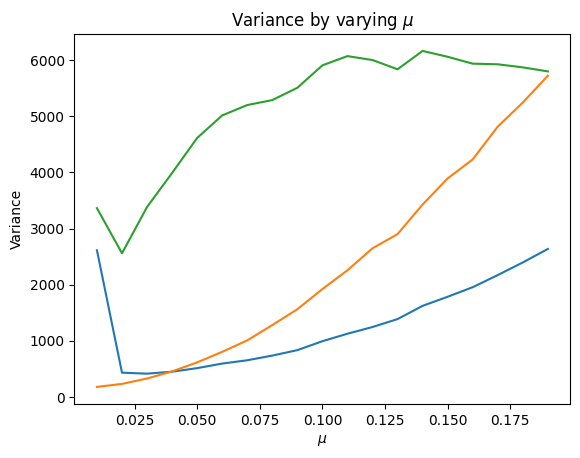

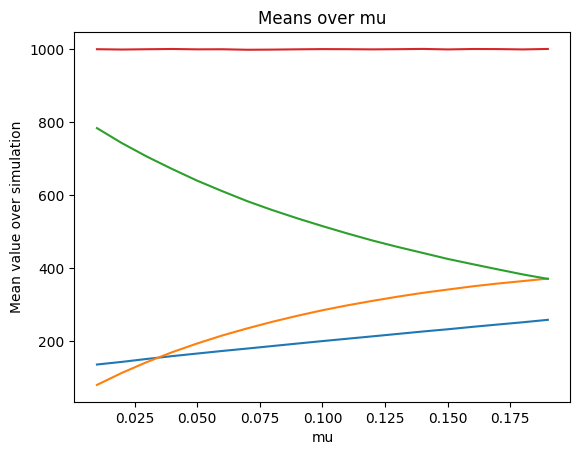

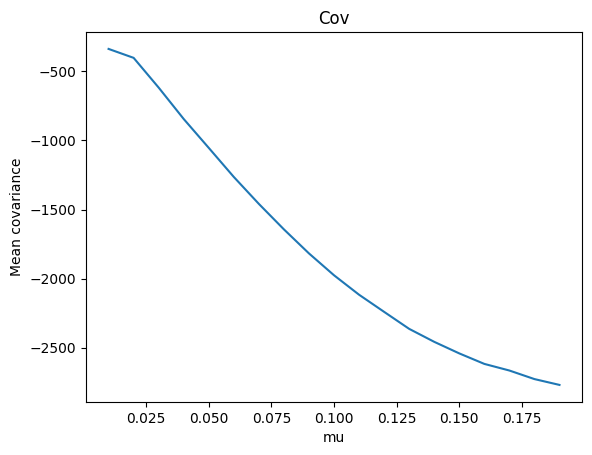

In [26]:
plot_variance_outcome(mu_end_values, mus, "Variance by varying $\\mu$", "$\\mu$")
plot_mean(mu_mean, mus, "Means over mu", "mu")
plot_SI_cov(mu_cov, mus, "Cov", "mu")

In [27]:
Ns = np.array([10, 25, 100, 250, 1000, 2500, 10000, 25000])
N_end_values = np.zeros((len(Ns), n_sim_runs, 3))
N_mean = np.zeros((len(Ns), n_sim_runs, 3))
N_cov = np.zeros((len(Ns), n_sim_runs))

for i, _N in enumerate(tqdm(Ns)):
    for j in range(n_sim_runs):
        result_statistics = get_statistics(event_based_simulation(np.ceil((1 - initial_infection) * _N), np.floor(initial_infection*_N), 0, b_0, gamma, mu, t_end), t_end)
        N_mean[i, j] = result_statistics[0]
        N_end_values[i, j] = result_statistics[1][2:]
        N_cov[i, j] = result_statistics[2]

  0%|          | 0/8 [00:00<?, ?it/s]

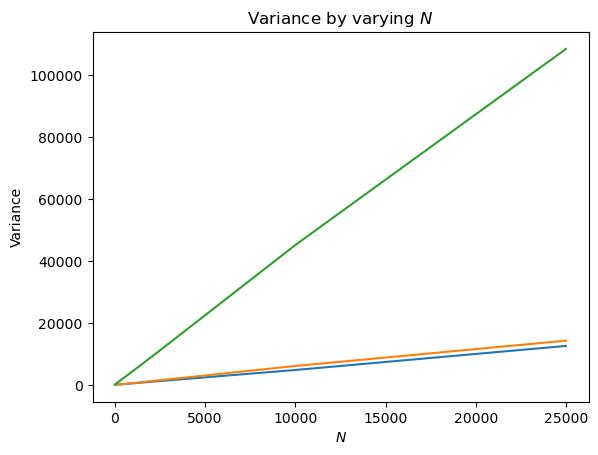

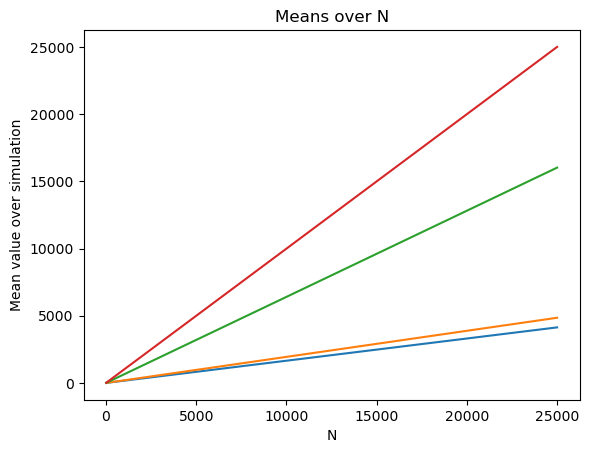

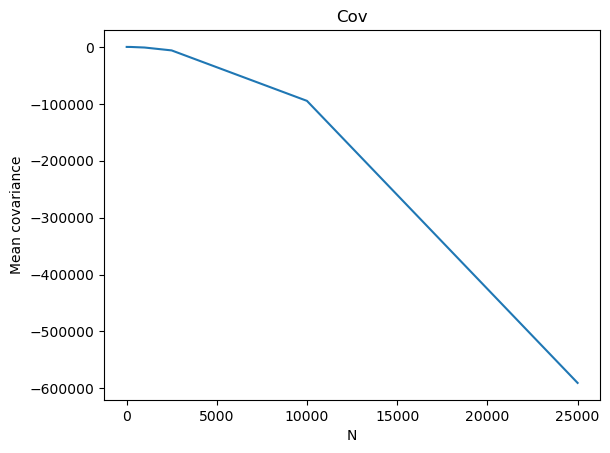

In [16]:
plot_variance_outcome(N_end_values, Ns, "Variance by varying $N$", "$N$")
plot_mean(N_mean, Ns, "Means over N", "N")
plot_SI_cov(N_cov, Ns, "Cov", "N")

Example of Stochastic resonance and transients. I believe that increased appears when Gamma is high, but am not yet sure. To measure transients, we start with the deterministic mean, and then look at the variance at that level. Note we do ignore extinction events, since that is not an example of transients.

In [8]:
def get_deterministic_mean(beta: float, gamma: float, mu: float, N: int, epsilon: float = 0.001):
    def sir_model(t: float, SIR: np.ndarray):
        S, I, R = SIR

        return np.array([
            mu - beta*S*I - mu * S,
            beta*S*I-gamma*I - mu * I,
            gamma*I - mu * R
        ])
    
    t_end = 5
    t_start = 0
    initial_infection = 0.01
    while True:
        integrated_sir = igr.solve_ivp(sir_model, [t_start, t_end], np.array([1-initial_infection, initial_infection, 0]), t_eval=np.arange(t_start, t_end, 0.1))
        provisional_deterministic_mean = integrated_sir.y[:, -1]
        prev_value = integrated_sir.y[:, -t_end]

        if (np.abs(provisional_deterministic_mean - prev_value)).sum() < epsilon:
            break
        else:
            t_end *= 2

    return np.rint(provisional_deterministic_mean * N).astype(int)

@jit(nopython=True)
def get_average_transient(delta_t, category, mean_distance):
    curr_cat = -1
    time_list = []
    distance_list = []
    
    for i in range(len(delta_t)):
        if category[i] != curr_cat:
            time_list.append(0.0)
            distance_list.append(0.0)

        distance_list[-1] = max(distance_list[-1], mean_distance[i])
        time_list[-1] += delta_t[i]
    
    time_array = np.array(time_list)
    distance_array = np.array(distance_list)

    return time_array @ distance_array

def get_transients(beta: float, gamma: float, mu: float, N: int, sim_iterations: int, T_max: float):
    inital_values = get_deterministic_mean(beta, gamma, mu, N)
    transients = np.zeros(sim_iterations)

    for i in range(sim_iterations):
        sim_results = event_based_simulation(inital_values[0], inital_values[1], inital_values[2], beta, gamma, mu, T_max)
        delta_t = sim_results[:, 1]
        suseptibles = sim_results[:, 2]
        infecteds = sim_results[:, 3]

        if infecteds.min() == 0:
            transients[i] = np.nan
            continue

        mean_suseptibles = suseptibles.mean()
        suseptibles_abs_from_mean = np.abs(suseptibles - mean_suseptibles)
        above_mean = (suseptibles > mean_suseptibles).astype(int)
        category = np.concatenate([[0], np.cumsum(np.absolute(above_mean[:-1] - above_mean[1:]))])
        transients[i] = get_average_transient(delta_t, category, suseptibles_abs_from_mean)

    return np.nanmean(transients)

get_transients(1.5, 0.8, 0.2, 1000, 100, 100)

5778.8012770892865

In [186]:
b_0 = 1.5
gamma = 0.7
mu = 0.1
N = 1000
T_max = 100
sim_iterations = 100

betas = np.arange(1.2, 2.0, 0.025)
beta_transients = np.zeros(len(betas))

for i, _beta in enumerate(tqdm(betas)):
    beta_transients[i] = get_transients(_beta, gamma, mu, N, sim_iterations, T_max)

  0%|          | 0/32 [00:00<?, ?it/s]

In [170]:
gammas = np.arange(0.1, 0.9, 0.025)
gamma_transients = np.zeros(len(gammas))

for i, _gamma in enumerate(tqdm(gammas)):
    gamma_transients[i] = get_transients(b_0, _gamma, mu, N, sim_iterations, T_max)

  0%|          | 0/32 [00:00<?, ?it/s]

In [197]:
mus = np.arange(0.01, 0.2, 0.01)
mu_transients = np.zeros(len(mus))
sim_iterations = 10000
for i, _mu in enumerate(tqdm(mus)):
    mu_transients[i] = get_transients(b_0, gamma, _mu, N, sim_iterations, T_max)

  0%|          | 0/19 [00:00<?, ?it/s]

In [199]:
gamma = 0.2
Ns = [50, 100, 250, 1000, 2500, 5000, 10000]
N_transients = np.zeros(len(Ns))
sim_iterations = 1000
for i, _N in enumerate(tqdm(Ns)):
    N_transients[i] = get_transients(b_0, gamma, mu, _N, sim_iterations, T_max)

  0%|          | 0/7 [00:00<?, ?it/s]

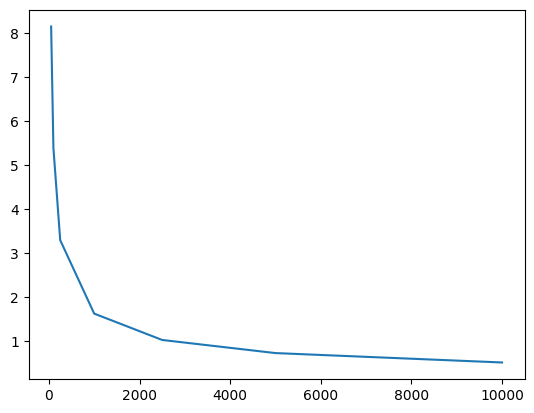

In [201]:
plt.plot(Ns, N_transients/Ns)
plt.show()

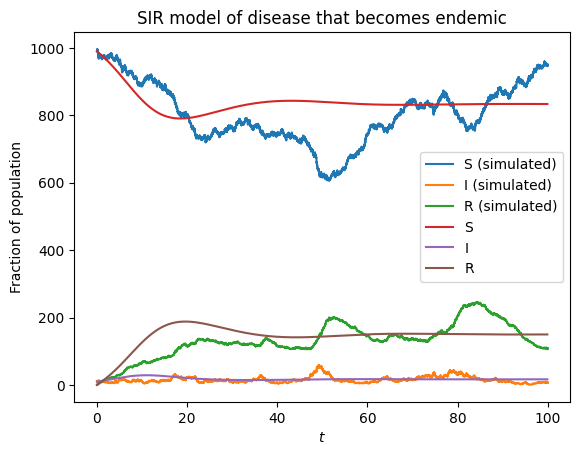

array([[0.00000000e+00, 1.67089791e-03, 9.90000000e+02, 1.00000000e+01,
        0.00000000e+00],
       [1.67089791e-03, 1.37210312e-04, 9.91000000e+02, 1.00000000e+01,
        0.00000000e+00],
       [1.80810823e-03, 8.11672137e-03, 9.92000000e+02, 1.00000000e+01,
        0.00000000e+00],
       ...,
       [9.99884560e+01, 1.57421128e-03, 9.48000000e+02, 6.00000000e+00,
        1.09000000e+02],
       [9.99900302e+01, 1.94776606e-02, 9.49000000e+02, 6.00000000e+00,
        1.09000000e+02],
       [1.00009508e+02, 0.00000000e+00, 9.50000000e+02, 6.00000000e+00,
        1.09000000e+02]])

In [182]:
t_start = 0
t_end = 100
initial_infection = 0.01
N = 1000
b_0 = 1.2
gamma = 0.9
mu = 0.1
run_simulation_and_graph(t_start, t_end, initial_infection, N, b_0, gamma, mu)

## Extinction events
Two measurements, probability of extinction for T_max and time until extinction.

In [10]:
@jit(nopython=True)
def get_time_till_extinction(infections: np.ndarray, t: np.ndarray):
    minimum = np.argmin(infections)
    return t[minimum] if minimum != 0 else np.nan

@jit(nopython=True)
def get_expected_extinction_time(N: int, initial_infection: float, b_0: float, gamma: float, mu: float, T_max: float, n_sim: int, b_1: float = 0.0, omega: float = 0.0):
    X_0 = int((1-initial_infection)*N)
    Y_0 = N - X_0
    Z_0 = 0
    extinction_times = np.zeros(n_sim)

    for i in range(n_sim):
        simulation_results = event_based_simulation(X_0, Y_0, Z_0, b_0, gamma, mu, T_max, b_1, omega)
        extinction_times[i] = get_time_till_extinction(simulation_results[:,3], simulation_results[:, 0])

    return np.nanmean(extinction_times), np.nanmedian(extinction_times), np.nanmean(extinction_times[extinction_times > 50]), np.nanmedian(extinction_times[extinction_times > 50]), np.isnan(extinction_times).sum()

In [11]:
# For JIT
get_expected_extinction_time(1000, 0.01, 1.5, 0.2, 0.01, 1000, 2, b_1=0.5, omega=2*np.pi/30)

(385.46947468183413,
 385.46947468183413,
 385.46947468183413,
 385.46947468183413,
 0)

In [345]:
get_expected_extinction_time(1000, 0.01, 1.5, 0.5, 0.01, 10000, 100, b_1=0.0, omega=2*np.pi/30)

(27.1213301283992,
 25.142129540983525,
 61.98212589300317,
 56.291267528338835,
 0)

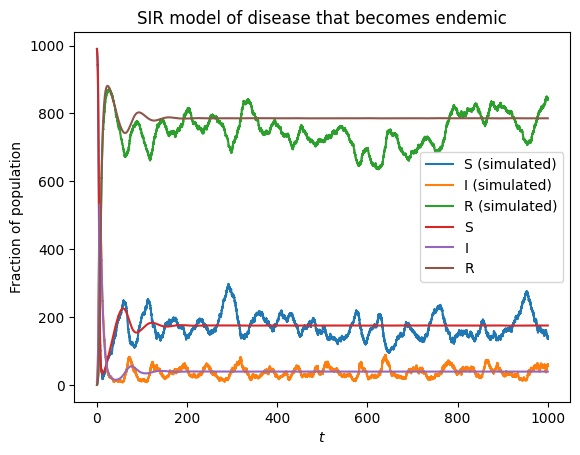

array([[0.00000000e+00, 4.55031717e-02, 9.90000000e+02, 1.00000000e+01,
        0.00000000e+00],
       [4.55031717e-02, 2.20268967e-03, 9.89000000e+02, 1.00000000e+01,
        0.00000000e+00],
       [4.77058614e-02, 7.91910043e-02, 9.88000000e+02, 1.00000000e+01,
        0.00000000e+00],
       ...,
       [9.99929145e+02, 3.89605818e-04, 1.36000000e+02, 5.80000000e+01,
        8.45000000e+02],
       [9.99929535e+02, 1.28643880e-01, 1.36000000e+02, 5.70000000e+01,
        8.46000000e+02],
       [1.00005818e+03, 0.00000000e+00, 1.36000000e+02, 5.60000000e+01,
        8.46000000e+02]])

In [12]:
run_simulation_and_graph(0, 1000, 0.01, 1000, 1.2, 0.2, 0.01)

In [13]:
Ns = [50, 75, 100, 175, 250, 375, 500, 750, 1000]
beta = 1.2
gamma = 0.2
mu = 0.01
initial_infection = 0.01
n_sim = 1000
T_max = [1000, 1500, 2000, 2500, 2500, 4000, 7000, 10000, 15000]

expected_extinction_times = np.zeros(len(Ns))
expected_extinction_times_med = np.zeros(len(Ns))
expected_cond_extinction_times = np.zeros(len(Ns))
expected_cond_extinction_times_med = np.zeros(len(Ns))
no_extinction = np.zeros(len(Ns))

for i, _N in enumerate(tqdm(Ns)):
    res = get_expected_extinction_time(_N, initial_infection, beta, gamma, mu, T_max[i], n_sim)
    expected_extinction_times[i] = res[0]
    expected_extinction_times_med[i] = res[1]
    expected_cond_extinction_times = res[2]
    expected_cond_extinction_times_med = res[3]
    no_extinction[i] = res[4]

  0%|          | 0/9 [00:00<?, ?it/s]

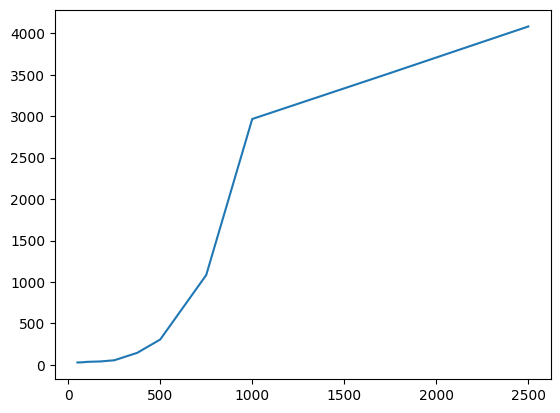

In [369]:
plt.plot(Ns, expected_extinction_times_med)
plt.show()

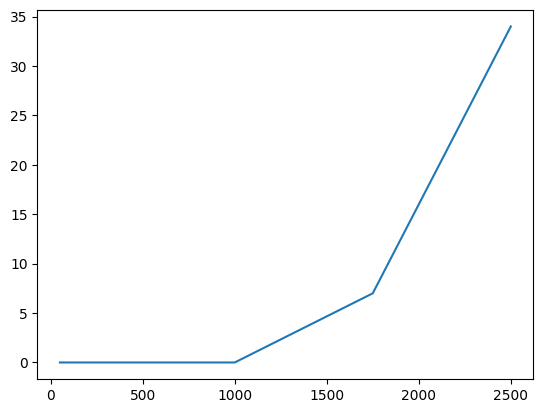

In [370]:
plt.plot(Ns, no_extinction)
plt.show()

In [60]:
def estimate_probabilities(t_end: int, initial_infection: float, N: int, beta: float, gamma: float, mu: float, n_sim: int):
    for i in trange(n_sim):
        event_based_simulation((1 - initial_infection) * N, initial_infection*N, 0, beta, gamma, mu, t_end)

estimate_probabilities(1000, 0.01, 100, 1.5, 0.6, 0.05, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

### Preparation for part 2: Following the tutorial of ndlib

In [21]:
# Network Definition
g = nx.erdos_renyi_graph(1000, 0.1)

# Model Selection
model = ep.SIRModel(g)

In [22]:
import ndlib.models.ModelConfig as mc

# Model Configuration
config = mc.Configuration()
config.add_model_parameter('beta', 0.001)
config.add_model_parameter('gamma', 0.01)
config.add_model_parameter("fraction_infected", 0.05)
model.set_initial_status(config)

In [23]:
# Simulation
iterations = model.iteration_bunch(200)
trends = model.build_trends(iterations)

In [24]:
from bokeh.io import output_notebook, show
from ndlib.viz.bokeh.DiffusionTrend import DiffusionTrend

trends = model.build_trends(iterations)
viz = DiffusionTrend(model, trends)
p = viz.plot(width=400, height=400)
show(p)

In [25]:
from ndlib.viz.bokeh.DiffusionPrevalence import DiffusionPrevalence

viz2 = DiffusionPrevalence(model, trends)
p2 = viz2.plot(width=400, height=400)
show(p2)

In [26]:
print(viz.trends)

[{'trends': {'node_count': {0: [950, 947, 941, 936, 929, 925, 922, 919, 908, 898, 892, 882, 871, 862, 851, 842, 828, 814, 803, 793, 778, 764, 758, 741, 727, 709, 688, 670, 657, 635, 623, 608, 589, 572, 551, 529, 505, 486, 466, 447, 416, 402, 386, 369, 354, 334, 318, 301, 283, 267, 249, 239, 222, 208, 192, 179, 169, 155, 148, 139, 132, 122, 115, 108, 99, 94, 89, 84, 81, 77, 71, 70, 69, 64, 60, 54, 51, 47, 43, 42, 39, 30, 29, 28, 27, 24, 23, 22, 22, 22, 20, 19, 19, 17, 17, 15, 14, 14, 14, 14, 14, 14, 14, 14, 14, 13, 13, 13, 13, 11, 11, 10, 10, 9, 8, 7, 7, 7, 7, 7, 7, 7, 7, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 4, 4, 3, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 1: [50, 53, 59, 63, 70, 73, 76, 79, 90, 99, 105, 113, 124, 132, 139, 145, 159, 173, 183, 188, 199, 211, 215, 232, 243, 259, 275, 289, 299, 319, 326, 339, 356, 371, 390, 407, 425, 438, 451, 4

In [27]:
print(viz2.trends)

[{'trends': {'node_count': {0: [950, 947, 941, 936, 929, 925, 922, 919, 908, 898, 892, 882, 871, 862, 851, 842, 828, 814, 803, 793, 778, 764, 758, 741, 727, 709, 688, 670, 657, 635, 623, 608, 589, 572, 551, 529, 505, 486, 466, 447, 416, 402, 386, 369, 354, 334, 318, 301, 283, 267, 249, 239, 222, 208, 192, 179, 169, 155, 148, 139, 132, 122, 115, 108, 99, 94, 89, 84, 81, 77, 71, 70, 69, 64, 60, 54, 51, 47, 43, 42, 39, 30, 29, 28, 27, 24, 23, 22, 22, 22, 20, 19, 19, 17, 17, 15, 14, 14, 14, 14, 14, 14, 14, 14, 14, 13, 13, 13, 13, 11, 11, 10, 10, 9, 8, 7, 7, 7, 7, 7, 7, 7, 7, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 4, 4, 3, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 1: [50, 53, 59, 63, 70, 73, 76, 79, 90, 99, 105, 113, 124, 132, 139, 145, 159, 173, 183, 188, 199, 211, 215, 232, 243, 259, 275, 289, 299, 319, 326, 339, 356, 371, 390, 407, 425, 438, 451, 4

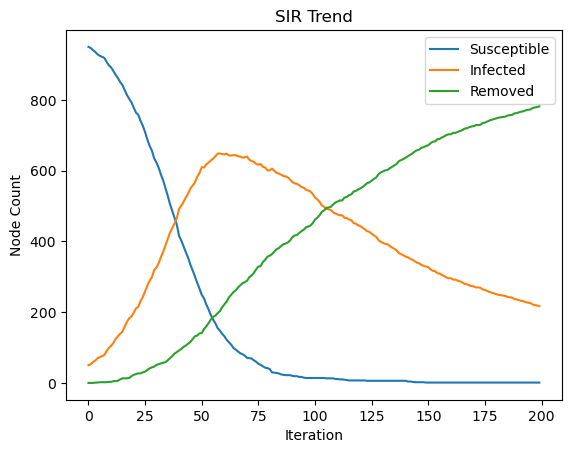

In [28]:
# plotting the SIR model in matplotlib since the package does not always work
trends_data = viz.trends
node_count_data = trends_data[0]['trends']['node_count']

# Plot
node_labels = {0: 'Susceptible', 1: 'Infected', 2: 'Removed'}

for node, counts in node_count_data.items():
    label = node_labels[node]
    plt.plot(counts, label=f'{label}')

plt.xlabel('Iteration')
plt.ylabel('Node Count')
plt.title('SIR Trend')

plt.legend()

plt.show()

## Problem 2
### 2.1 Implement SIR and Simulate

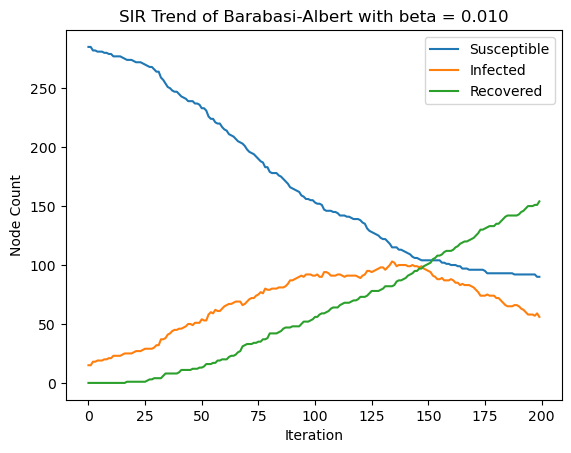

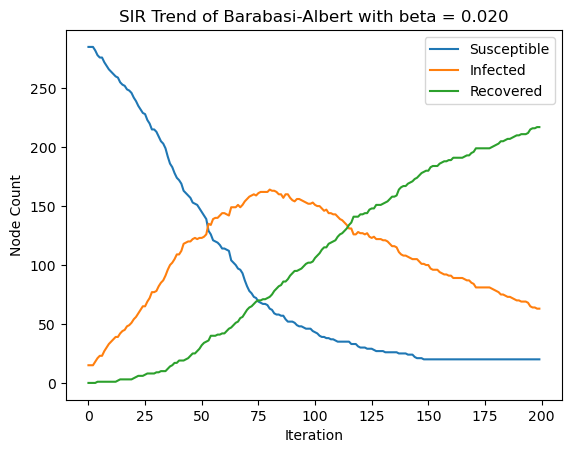

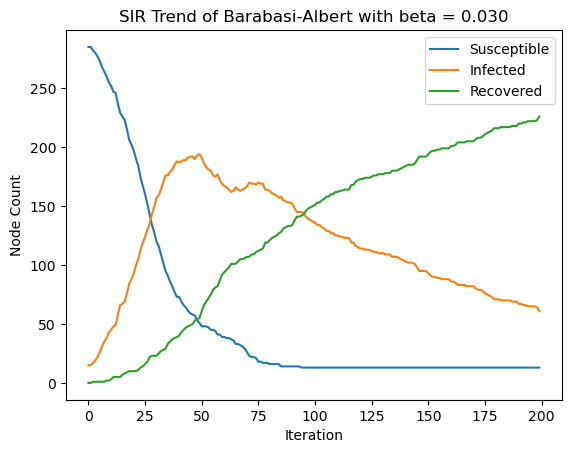

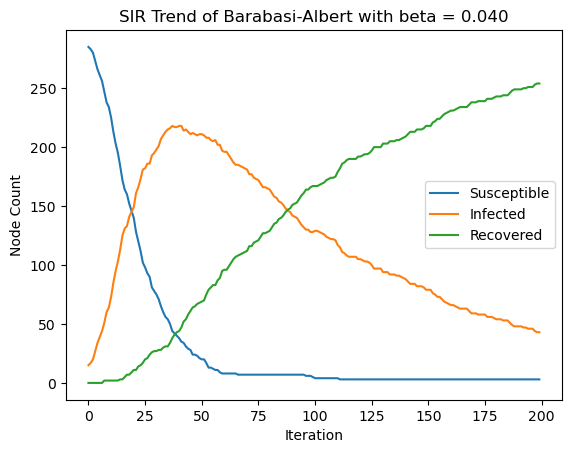

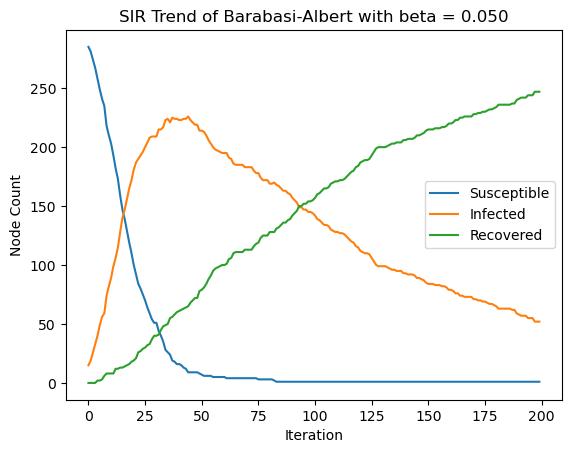

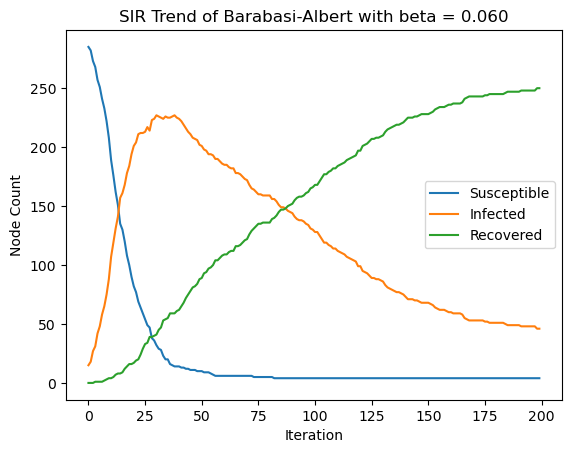

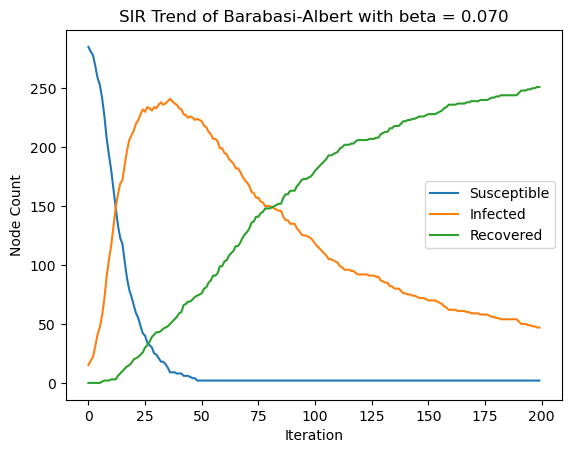

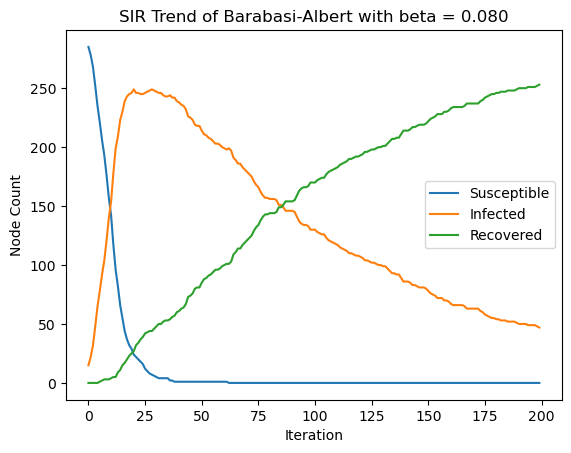

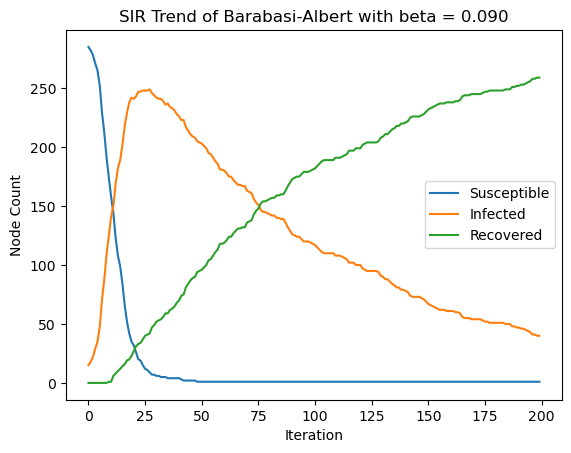

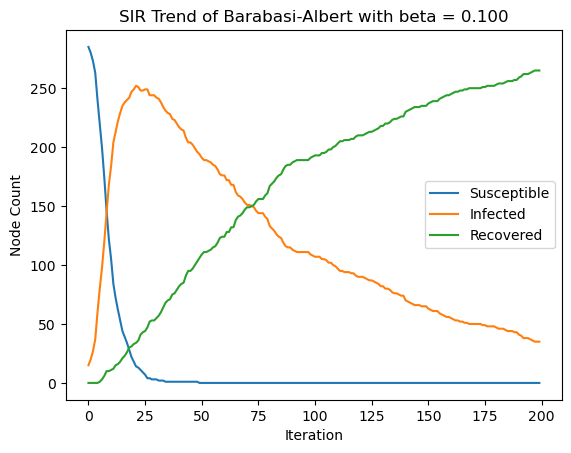

In [29]:
# Function to run SIR simulation and plot it out
def run_sir_simulation(graph, graph_name, beta, gamma, fraction_infected):
    """
    Run an SIR simulation on the given network graph.

    Parameters:
    - graph: NetworkX graph
        The network graph on which the simulation will be conducted.
    - graph_name: str
        A descriptive name for the graph being used in the simulation.
    - beta: float
        Infection rate.
    - gamma: float
        Recovery rate.
    - fraction_infected: float
        Initial fraction of infected nodes in the network.

    This function runs an SIR simulation on the provided graph with the specified parameters and plots the resulting trends
    of susceptible, infected and recovered over iterations.
    """
    sir_model = ep.SIRModel(graph)

    # Model Configuration
    config = mc.Configuration()
    config.add_model_parameter('beta', beta)  # Infection rate
    config.add_model_parameter('gamma', gamma)  # Recovery rate
    config.add_model_parameter('fraction_infected', fraction_infected)  # Initial fraction of infected nodes

    sir_model.set_initial_status(config)

    # Simulation
    iterations = sir_model.iteration_bunch(200)
    trends = sir_model.build_trends(iterations)[0]
    trends_data = trends
    node_count_data = trends_data['trends']['node_count']

    # Plot
    node_labels = {0: 'Susceptible', 1: 'Infected', 2: 'Recovered'}

    for node, counts in node_count_data.items():
        label = node_labels[node]
        plt.plot(counts, label=f'{label}')

    plt.xlabel('Iteration')
    plt.ylabel('Node Count')
    plt.title(f'SIR Trend of {graph_name} with beta = {beta:.3f}')
    plt.legend()
    plt.show()
    
    
# Function to run multiple simulations with varying parameters
def run_multiple_simulations(graph, graph_name, param_values_list):
    results = []

    for param_values in param_values_list:
        if not isinstance(param_values, list):
            raise ValueError("param_values must be a list of parameter sets")

        if len(param_values) != 3:
            raise ValueError("Each parameter set in param_values must contain exactly three values (beta, gamma, and fraction_infected)")

        beta, gamma, fraction_infected = param_values
        simulation_plot = run_sir_simulation(graph, graph_name, beta, gamma, fraction_infected)
        results.append(simulation_plot)

    return results


# Parameter to vary, for example beta and static gamma and fraction_infected
beta_values = np.linspace(0.01, 0.1, 10)  # Vary the infection rate
gamma = 0.01
fraction_infected = 0.05

param_values_list = []
for b_0 in beta_values:
    param_values_list.append([b_0, gamma, fraction_infected])

graph = nx.barabasi_albert_graph(n=300, m=2) # Test graph
results = run_multiple_simulations(graph, 'Barabasi-Albert', param_values_list)



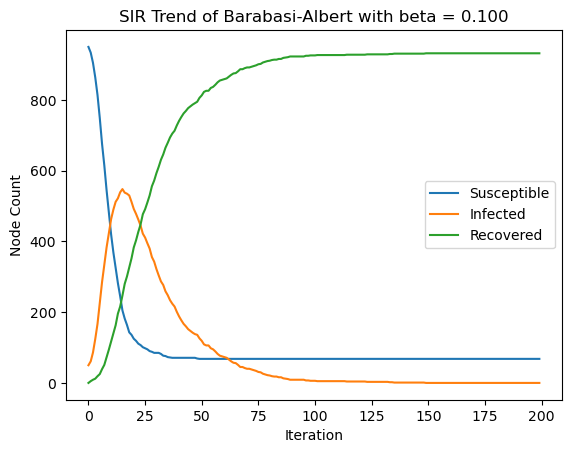

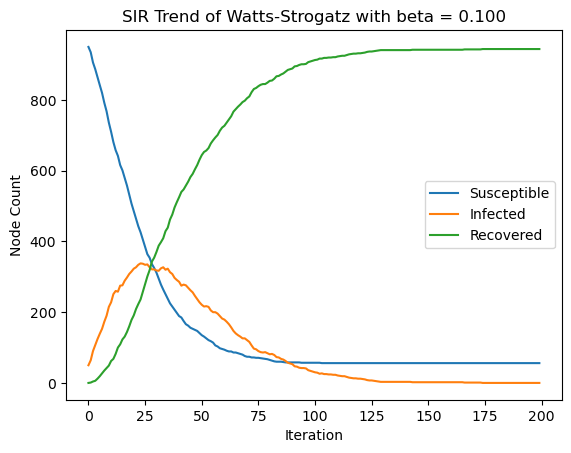

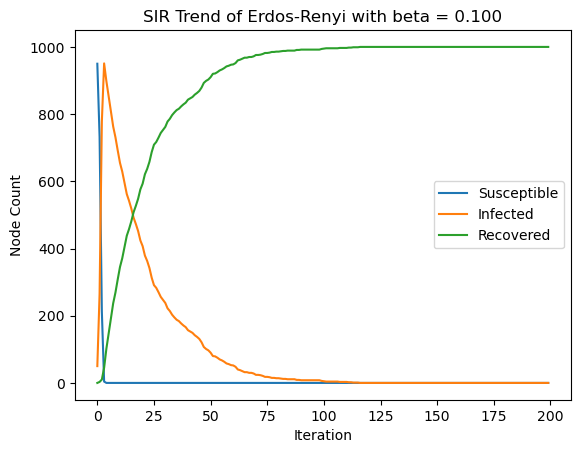

In [30]:
# Create different network models
ba_graph = nx.barabasi_albert_graph(n=1000, m=2)
ws_graph = nx.watts_strogatz_graph(n=1000, k=4, p=0.05)
er_graph = nx.erdos_renyi_graph(n=1000, p=0.05)
# Simulations
run_sir_simulation(ba_graph, 'Barabasi-Albert', 0.1, 0.05, 0.05)
run_sir_simulation(ws_graph, 'Watts-Strogatz', 0.1, 0.05, 0.05)
run_sir_simulation(er_graph, 'Erdos-Renyi', 0.1, 0.05, 0.05)

### 2.2 Generate Networks of equivalent form
Note that while generating instances here, a seed is set for reproducibility.
#### Definitions to generate statistics

In [31]:
# Function to generate Barabasi-Albert instances
def generate_ba_instances(num_instances, num_nodes=300, m=3, seed=10):
    instances = []
    for i in range(num_instances):
        # Generate Barabasi-Albert graph
        ba_graph = nx.barabasi_albert_graph(n=num_nodes, m=m, seed=seed + i)
        instances.append(ba_graph)

    return instances

# Function to generate Watts-Strogatz instances
def generate_ws_instances(num_instances, num_nodes=300, k=4, p=0.1, seed=10):
    instances = []
    for i in range(num_instances):
        # Generate Watts-Strogatz graph
        ws_graph = nx.watts_strogatz_graph(n=num_nodes, k=k, p=p, seed=seed + i)
        instances.append(ws_graph)

    return instances

# Function to generate Erdos-Renyi instances
def generate_er_instances(num_instances, num_nodes=300, p=0.1, seed=10):
    instances = []
    for i in range(num_instances):
        # Generate Erdos-Renyi graph
        er_graph = nx.erdos_renyi_graph(n=num_nodes, p=p, seed=seed + i)
        instances.append(er_graph)

    return instances

# Function to calculate centrality measures
def calculate_centrality_measures(graph):
    degree_centrality = nx.degree_centrality(graph)
    betweenness_centrality = nx.betweenness_centrality(graph)
    return degree_centrality, betweenness_centrality
    
# Function to plot centrality measures
def plot_centrality_measures(graph_name, centrality_measures, num_instances):
    plt.figure(figsize=(12, 16))
    
    all_degree_centrality, all_betweenness_centrality = zip(*centrality_measures)

    # Convert dictionaries to lists of values
    all_degree_centrality_values = [list(d.values()) for d in all_degree_centrality]
    all_betweenness_centrality_values = [list(d.values()) for d in all_betweenness_centrality]

    # Plot mean degree centrality
    plt.subplot(6, 1, 1)
    mean_degree_centrality = np.mean(all_degree_centrality_values, axis=0)
    plt.bar(range(1, len(mean_degree_centrality) + 1), mean_degree_centrality, alpha=0.5, label='Mean Degree Centrality')
    plt.title(f'{graph_name} - Mean Degree Centrality over {num_instances} runs')
    plt.xlabel('Node')
    plt.ylabel('Centrality')
    plt.legend(loc='upper right')

    # Plot standard deviation of degree centrality
    plt.subplot(6, 1, 2)
    std_degree_centrality = np.std(all_degree_centrality_values, axis=0)
    plt.bar(range(1, len(std_degree_centrality) + 1), std_degree_centrality, alpha=0.5, label='Standard Deviation of Degree Centrality')
    plt.title(f'{graph_name} - Standard Deviation of Degree Centrality over {num_instances} runs')
    plt.xlabel('Node')
    plt.ylabel('Standard Deviation')
    plt.legend(loc='upper right')

    # Plot mean degree centrality with standard deviation as error bars
    plt.subplot(6, 1, 3)
    plt.bar(range(1, len(mean_degree_centrality) + 1), mean_degree_centrality, yerr=std_degree_centrality, alpha=0.5, label='Mean Degree Centrality with Std Dev')
    plt.title(f'{graph_name} - Mean Degree Centrality with Standard Deviation over {num_instances} runs')
    plt.xlabel('Node')
    plt.ylabel('Centrality')
    plt.legend(loc='upper right')

    # Plot mean betweenness centrality
    plt.subplot(6, 1, 4)
    mean_betweenness_centrality = np.mean(all_betweenness_centrality_values, axis=0)
    plt.bar(range(1, len(mean_betweenness_centrality) + 1), mean_betweenness_centrality, alpha=0.5, label='Mean Betweenness Centrality')
    plt.title(f'{graph_name} - Mean Betweenness Centrality over {num_instances} runs')
    plt.xlabel('Node')
    plt.ylabel('Centrality')
    plt.legend(loc='upper right')

    # Plot standard deviation of betweenness centrality
    plt.subplot(6, 1, 5)
    std_betweenness_centrality = np.std(all_betweenness_centrality_values, axis=0)
    plt.bar(range(1, len(std_betweenness_centrality) + 1), std_betweenness_centrality, alpha=0.5, label='Standard Deviation of Betweenness Centrality')
    plt.title(f'{graph_name} - Standard Deviation of Betweenness Centrality over {num_instances} runs')
    plt.xlabel('Node')
    plt.ylabel('Standard Deviation')
    plt.legend(loc='upper right')

    # Plot mean betweenness centrality with standard deviation as error bars
    plt.subplot(6, 1, 6)
    plt.bar(range(1, len(mean_betweenness_centrality) + 1), mean_betweenness_centrality, yerr=std_betweenness_centrality, alpha=0.5, label='Mean Betweenness Centrality with Std Dev')
    plt.title(f'{graph_name} - Mean Betweenness Centrality with Standard Deviation over {num_instances} runs')
    plt.xlabel('Node')
    plt.ylabel('Centrality')
    plt.legend(loc='upper right')

    plt.subplots_adjust(hspace=1)
    plt.show()
    
# Function to calculate the average path length
def calculate_average_path_length(graph):
        avg_path_length = nx.average_shortest_path_length(graph)
        return avg_path_length
        
# Function to plot average path length
def plot_average_path_length(graph_name, instances, num_instances):
    plt.figure(figsize=(12, 6))

    avg_path_lengths = [calculate_average_path_length(graph) for graph in instances]

    # Plot average path length
    plt.bar(range(1, len(avg_path_lengths) + 1), avg_path_lengths, alpha=0.5, label='Average Path Length')
    plt.title(f'{graph_name} - Average Path Length over {num_instances} runs')
    plt.xlabel('Instance')
    plt.ylabel('Average Path Length')
    plt.legend(loc='upper right')
    plt.show()



### Statistics of different networks

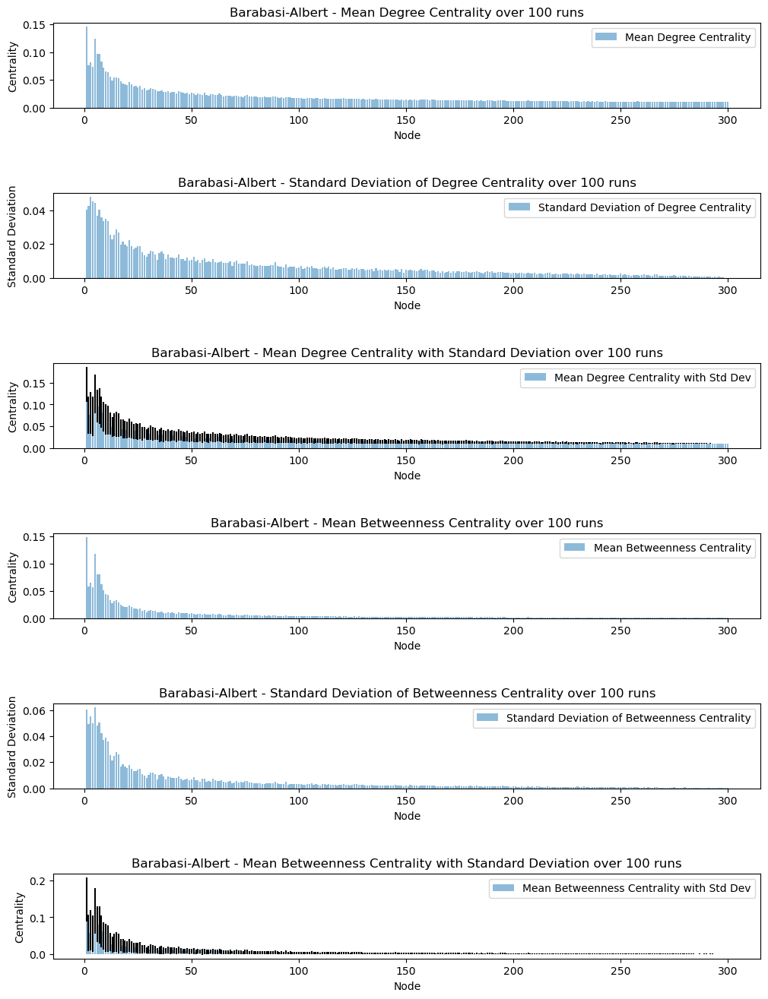

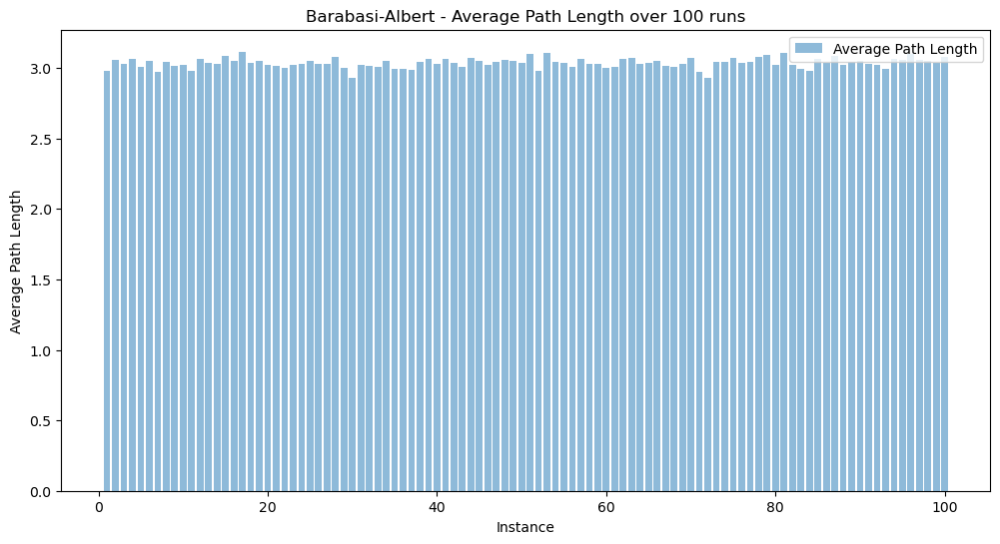

In [32]:
# Number of instances to generate
num_instances_ba = 100

# Generate Barabasi-Albert instances
ba_instances = generate_ba_instances(num_instances_ba)

# Calculate centrality measures for each instance
centrality_measures = [calculate_centrality_measures(graph) for graph in ba_instances]

# Plot centrality measures
plot_centrality_measures('Barabasi-Albert', centrality_measures, num_instances_ba)

# Plot average path length
plot_average_path_length('Barabasi-Albert', ba_instances, num_instances_ba)

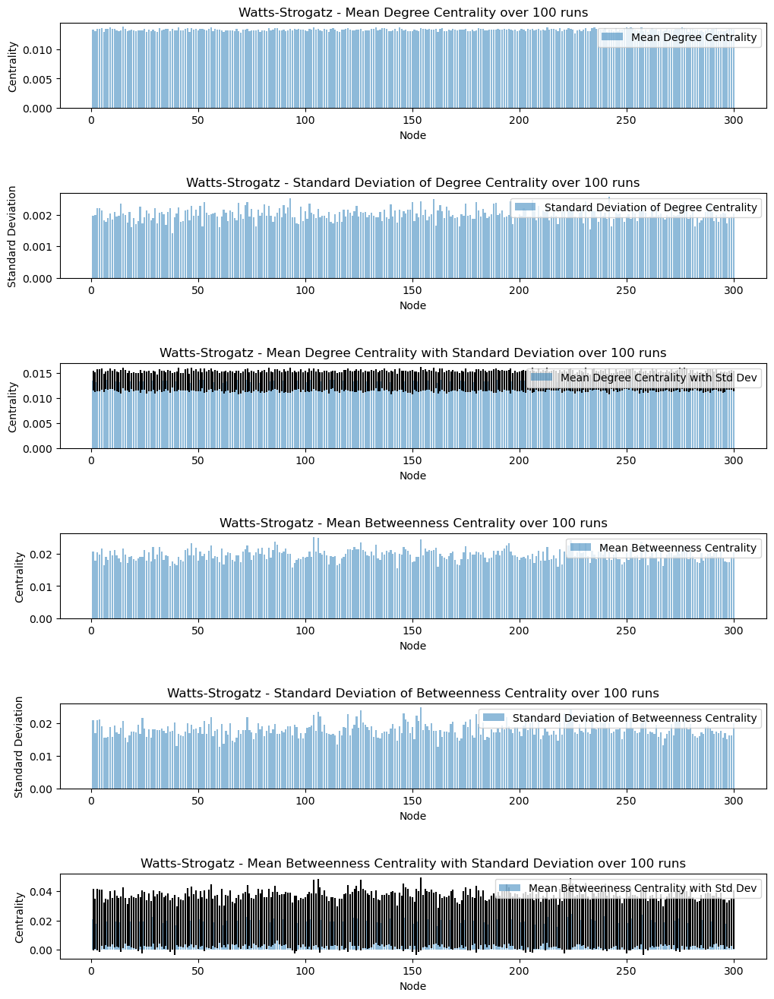

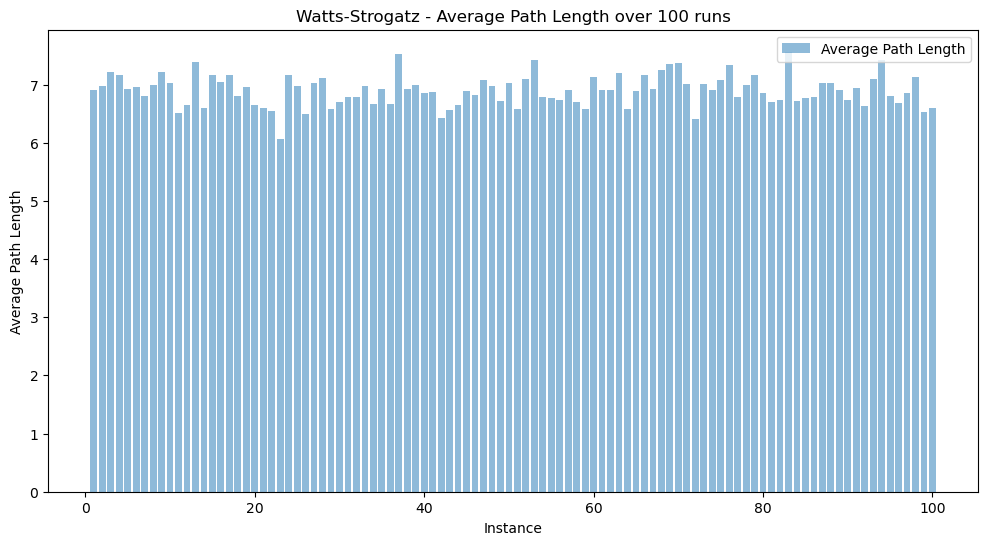

In [33]:
# Number of instances to generate
num_instances_ws = 100

# Generate Watts-Strogatz instances
ws_instances = generate_ws_instances(num_instances_ws)

# Calculate centrality measures for Watts-Strogatz instances
centrality_measures_ws = [calculate_centrality_measures(graph) for graph in ws_instances]

# Plot centrality measures
plot_centrality_measures('Watts-Strogatz', centrality_measures_ws, num_instances_ws)

# Plot average path length
plot_average_path_length('Watts-Strogatz', ws_instances, num_instances_ws)


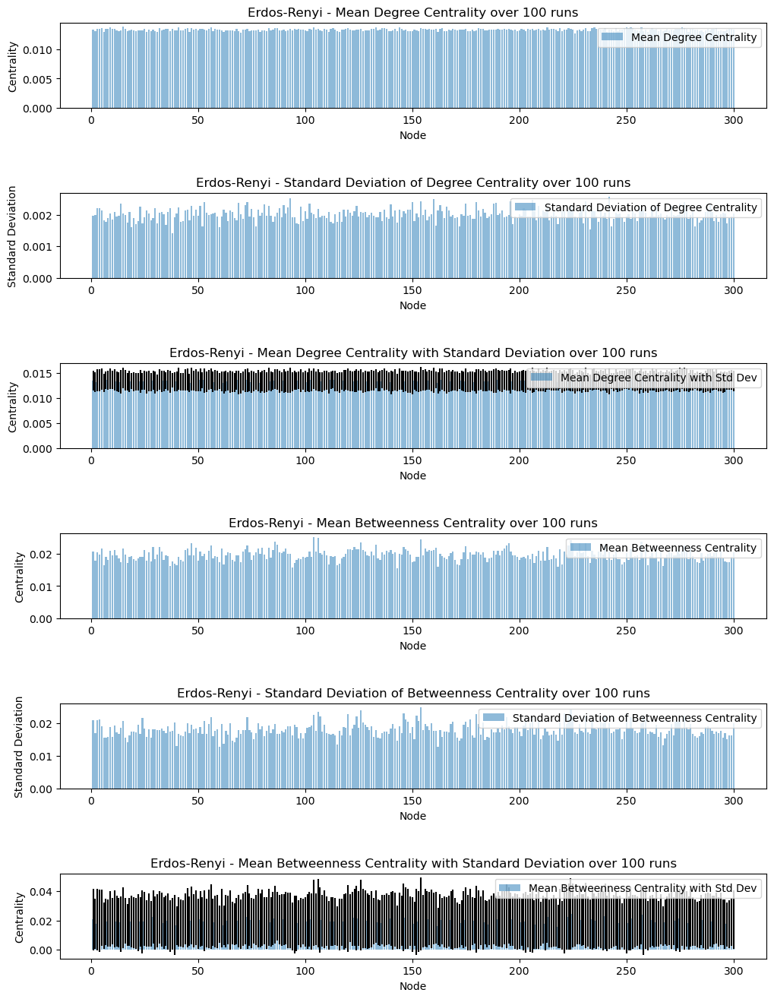

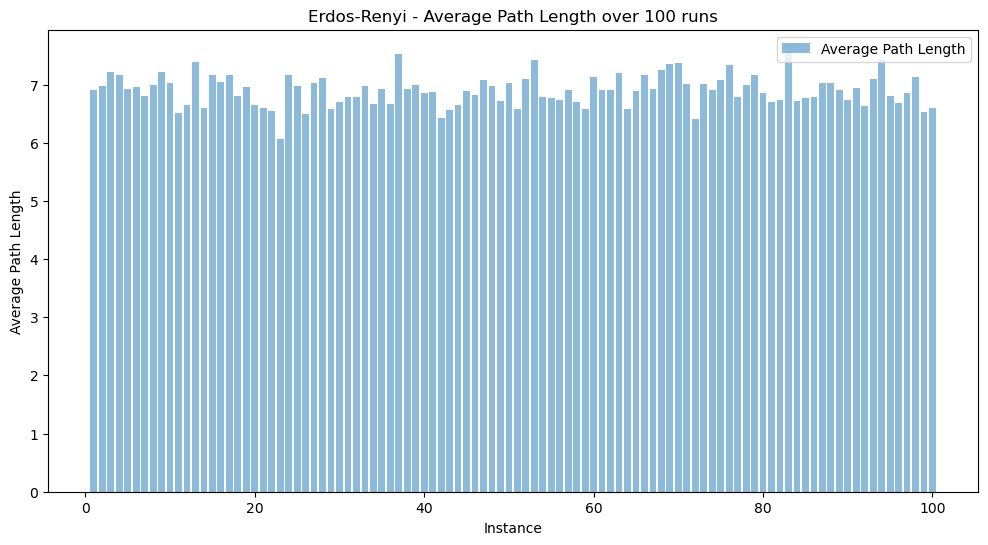

In [34]:
# Number of instances to generate
num_instances_er = 100

# Generate Erdos-Renyi instances
er_instances = generate_ws_instances(num_instances_er)


# Calculate centrality measures for Watts-Strogatz instances
centrality_measures_er = [calculate_centrality_measures(graph) for graph in er_instances]

# Plot centrality measures
plot_centrality_measures('Erdos-Renyi', centrality_measures_er, num_instances_er)

# Plot average path length
plot_average_path_length('Erdos-Renyi', er_instances, num_instances_er)

### Varying different parameters and comparing Centrality Measures

In [35]:
# Parameters to vary
# Applies to all networks
num_nodes_param = [100, 200, 400, 800]

# Applies only to Barabasi-Albert
m_param = [2, 4, 6, 8, 10]

# Applies only to Watts-Strogatz
k_param = [2, 4, 6, 8, 10]

# Applies to both Watts-Strogatz and Erdos-Renyi
p_param = [0.05, 0.1, 0.15, 0.2, 0.25]

#### Barabasi-Albert

Current number of edges attached: 2


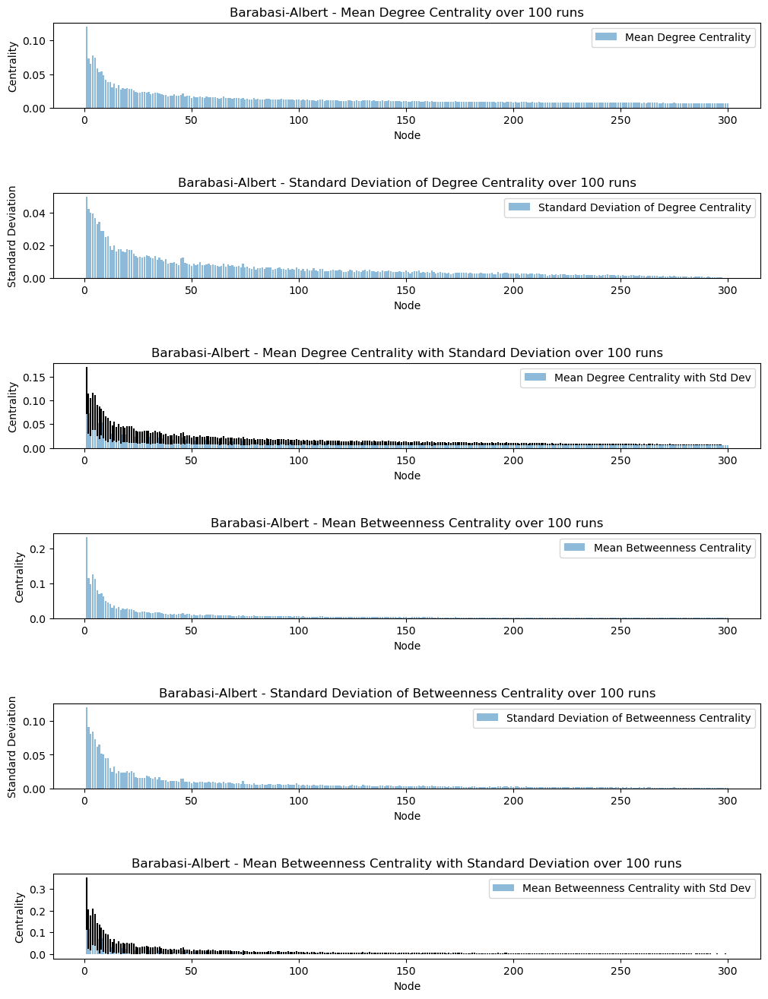

Current number of edges attached: 4


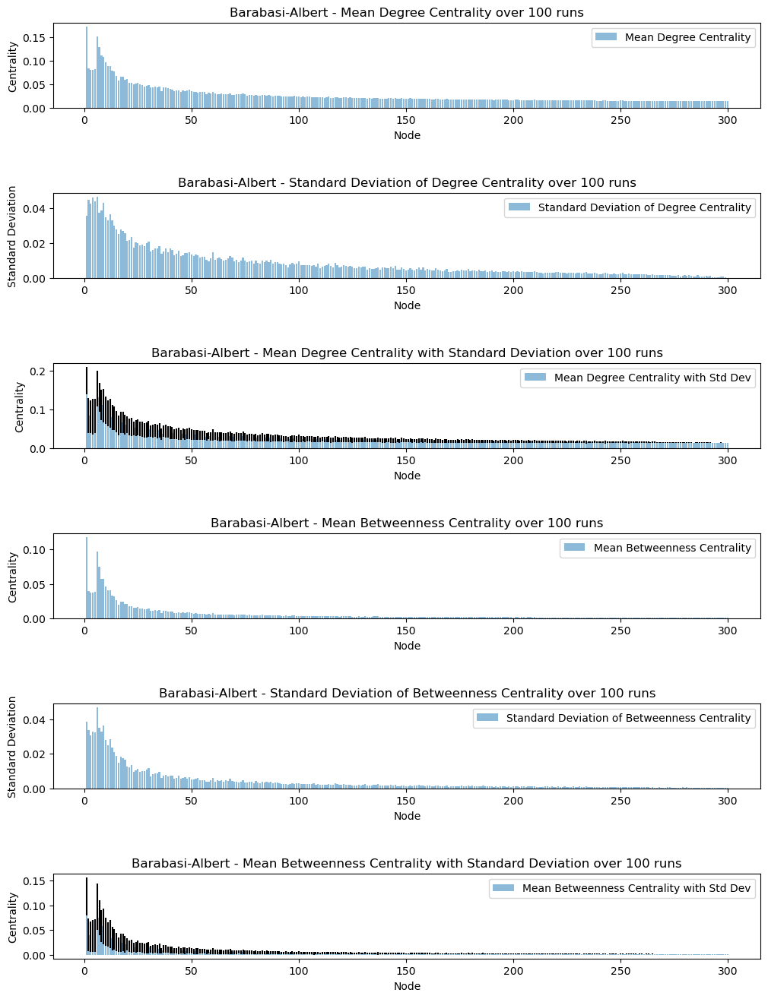

Current number of edges attached: 6


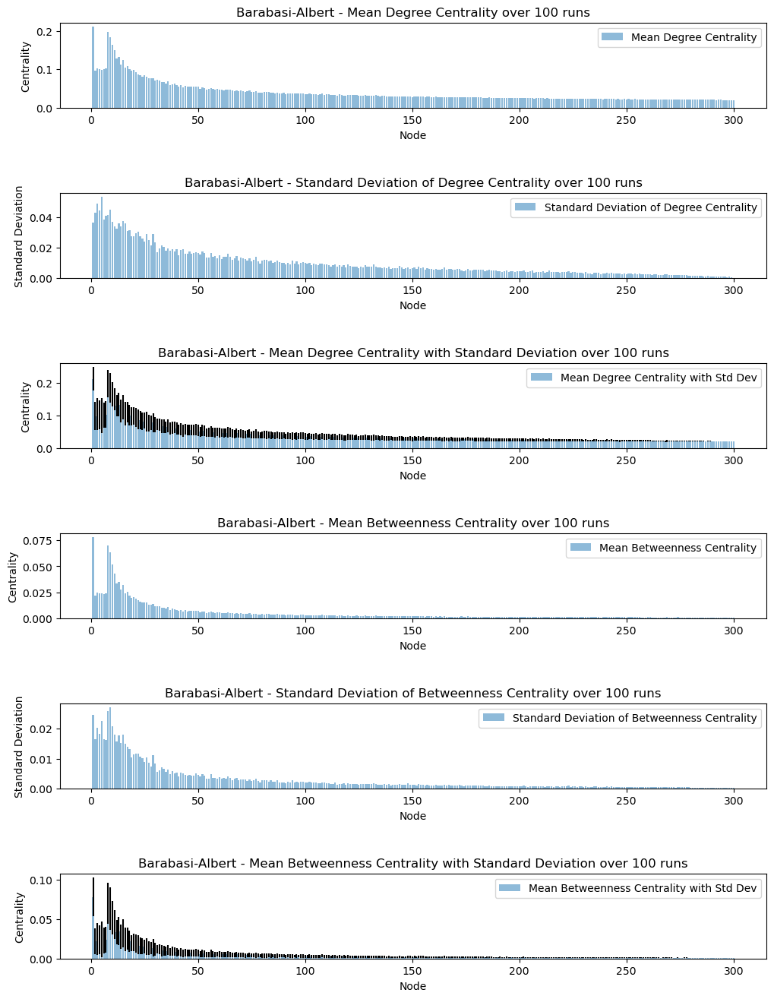

Current number of edges attached: 8


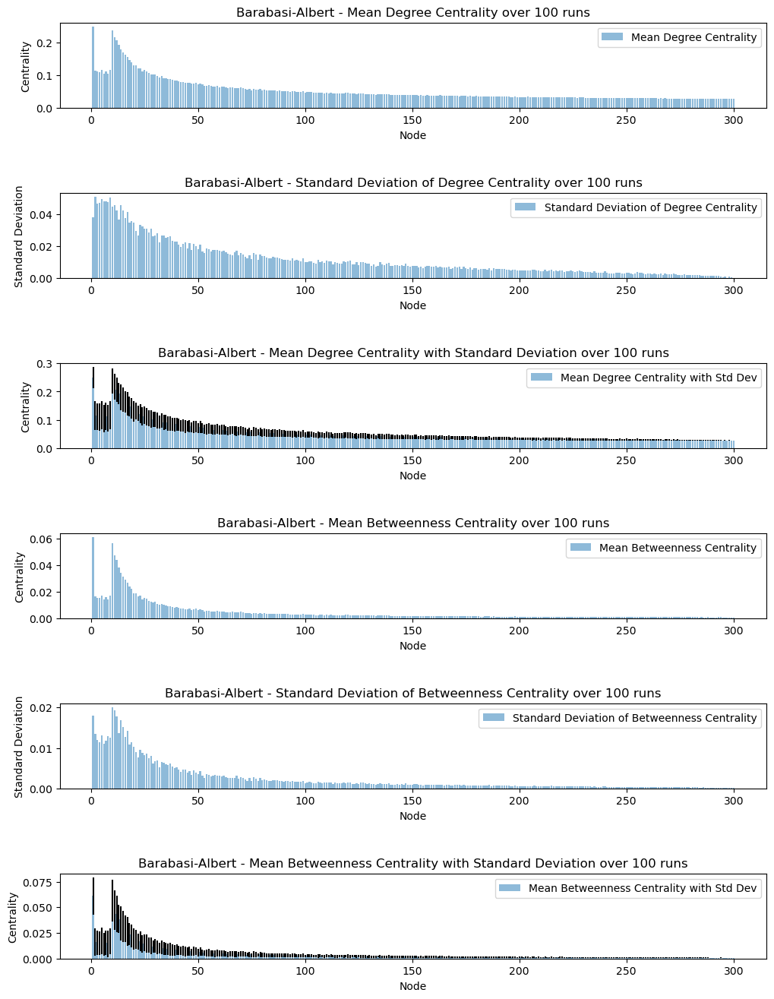

Current number of edges attached: 10


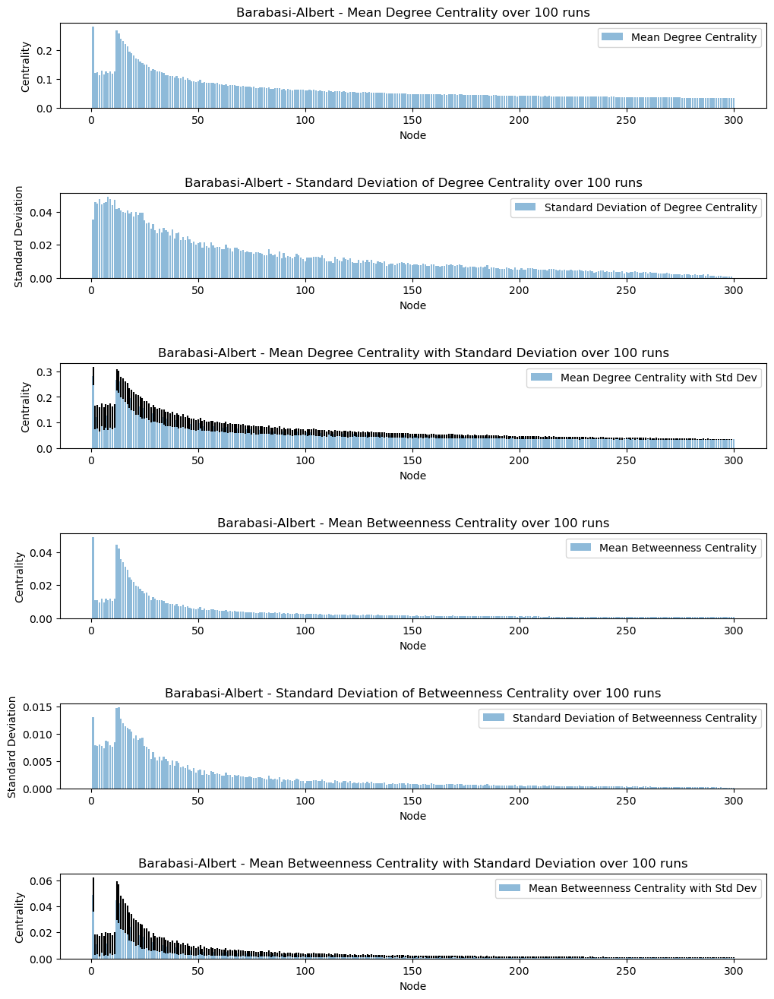

In [36]:
for param in m_param:
    # Generate Barabasi-Albert instances
    ba_instances = generate_ba_instances(num_instances_ba, num_nodes=300, m=param)
    print("Current number of edges attached:", param)
    centrality_measures = [calculate_centrality_measures(graph) for graph in ba_instances]
    plot_centrality_measures('Barabasi-Albert', centrality_measures, num_instances_ba)

#### Watts-Strogatz

Current number of edges attached: 100


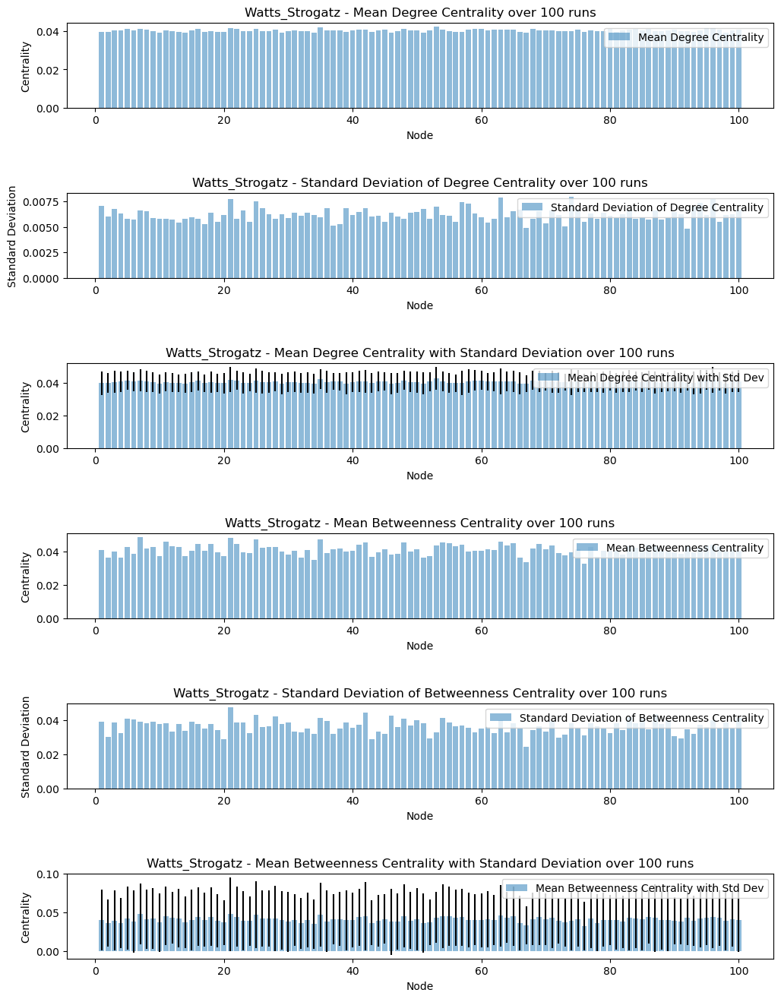

Current number of edges attached: 200


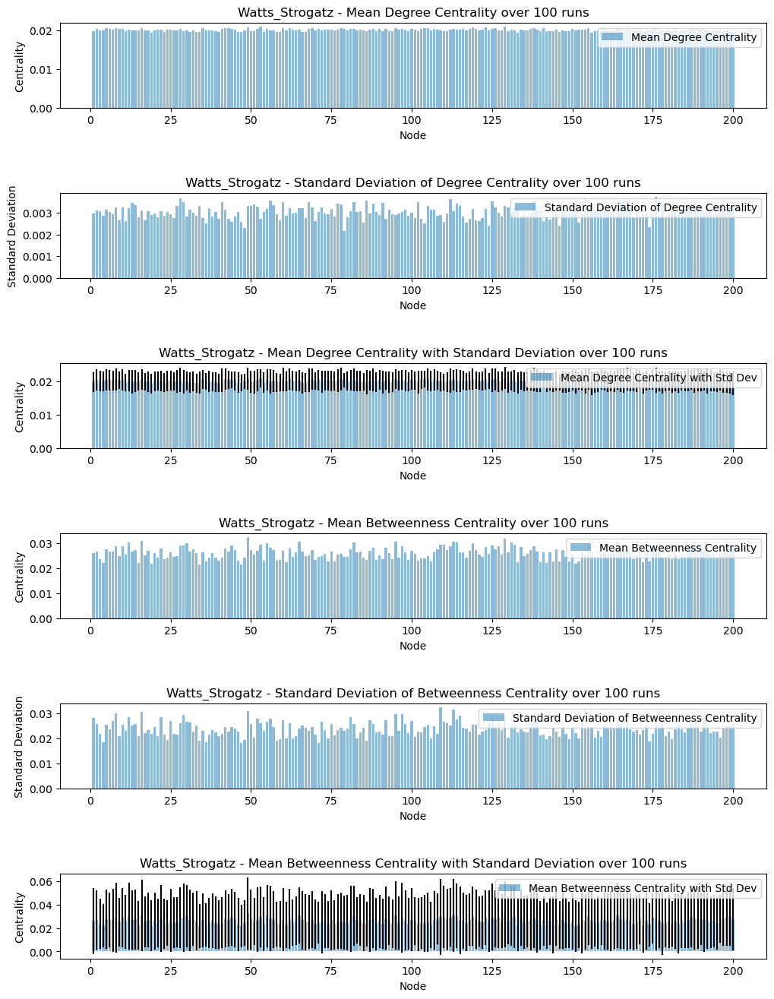

Current number of edges attached: 400


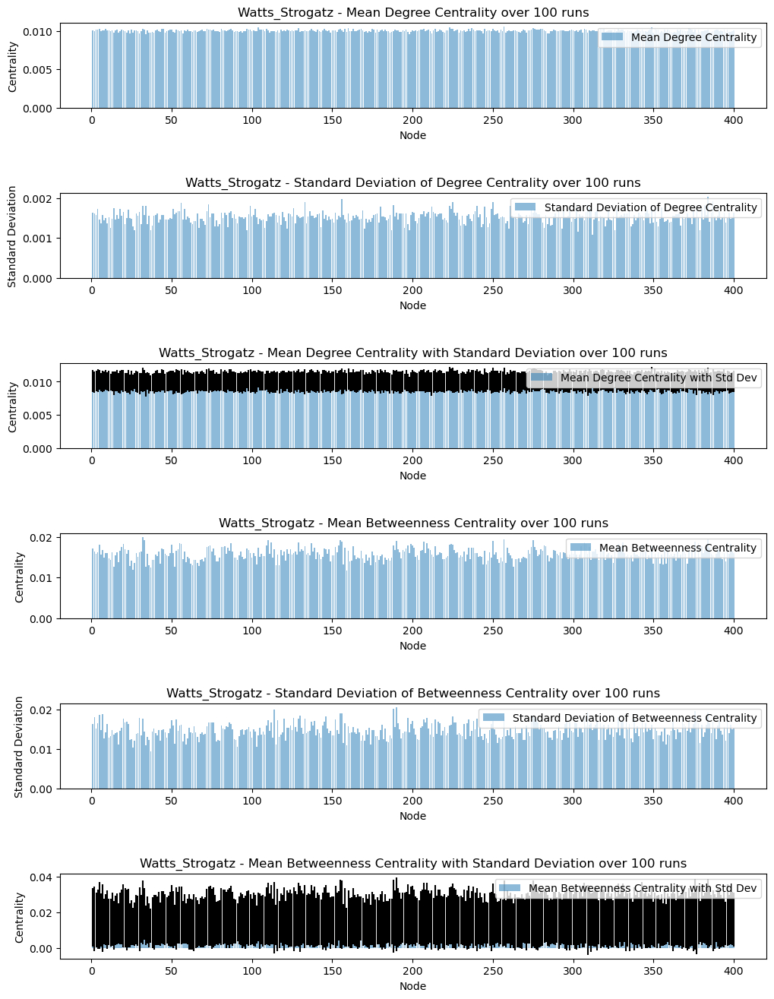

Current number of edges attached: 800


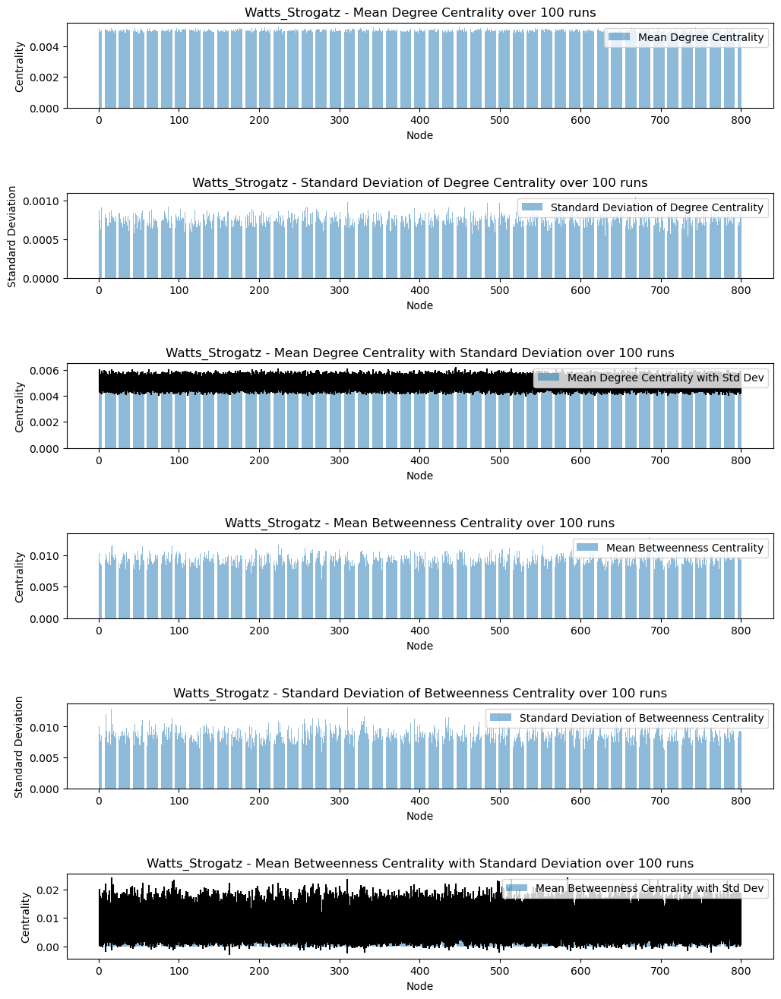

In [37]:
for param in num_nodes_param:
    # Generate Watts-Strogatz instances
    ws_instances = generate_ws_instances(num_instances_ws, num_nodes=param)
    print("Current number of edges attached:", param)
    centrality_measures = [calculate_centrality_measures(graph) for graph in ws_instances]
    plot_centrality_measures('Watts_Strogatz', centrality_measures, num_instances_ws)

Current number of nearest neighbour attached: 2


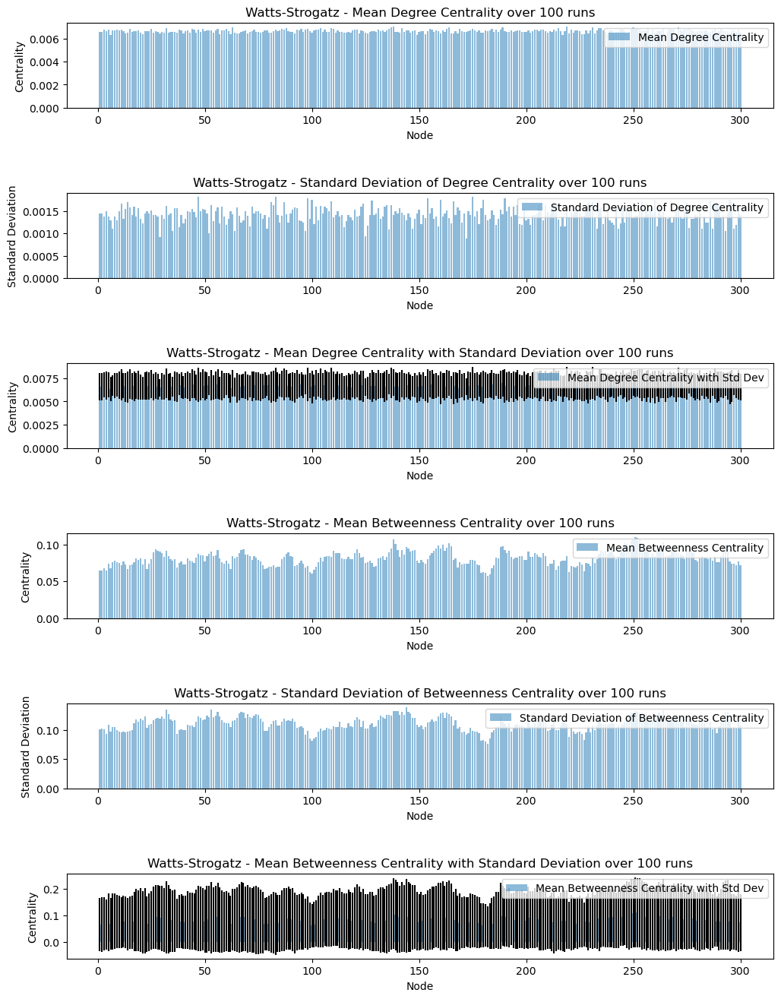

Current number of nearest neighbour attached: 4


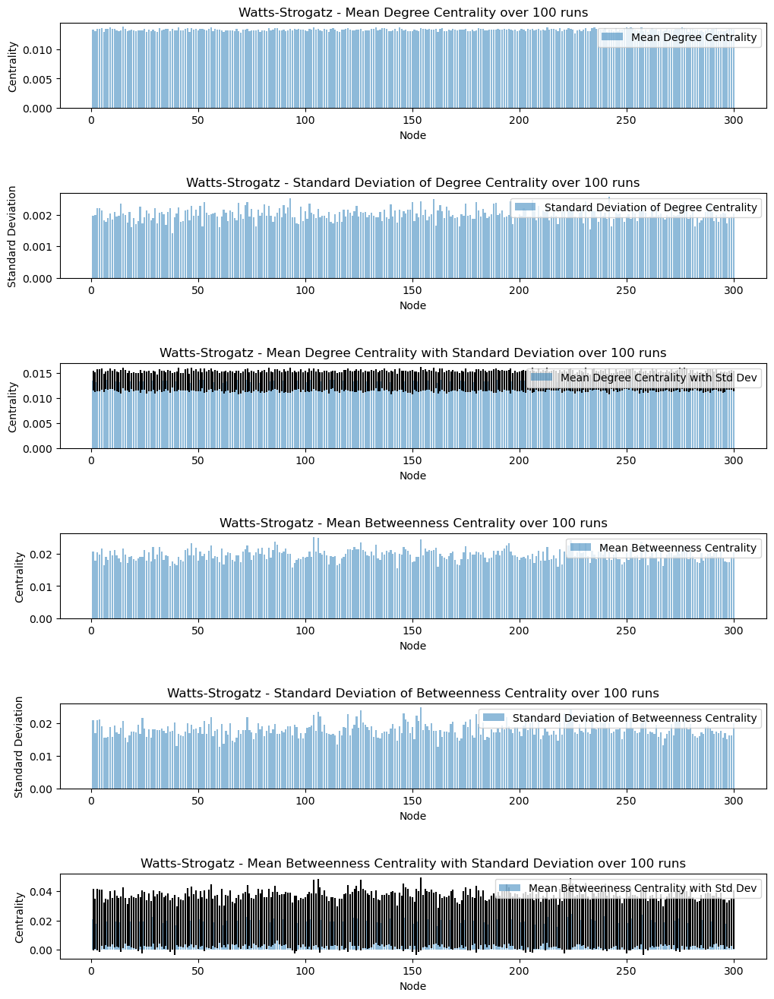

Current number of nearest neighbour attached: 6


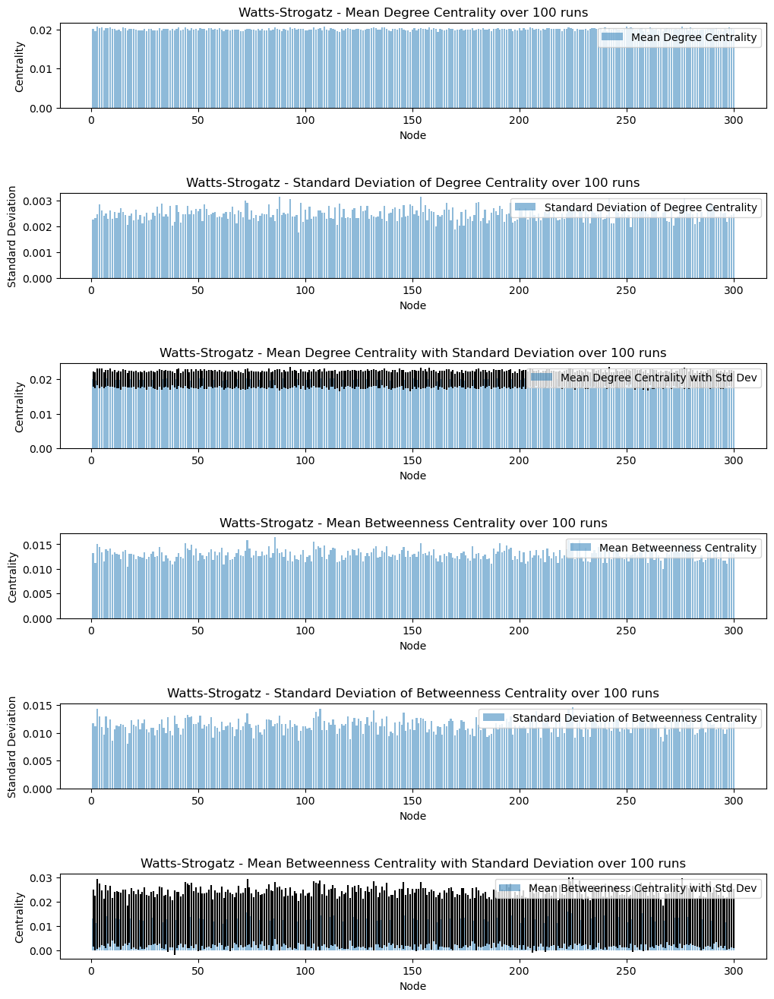

Current number of nearest neighbour attached: 8


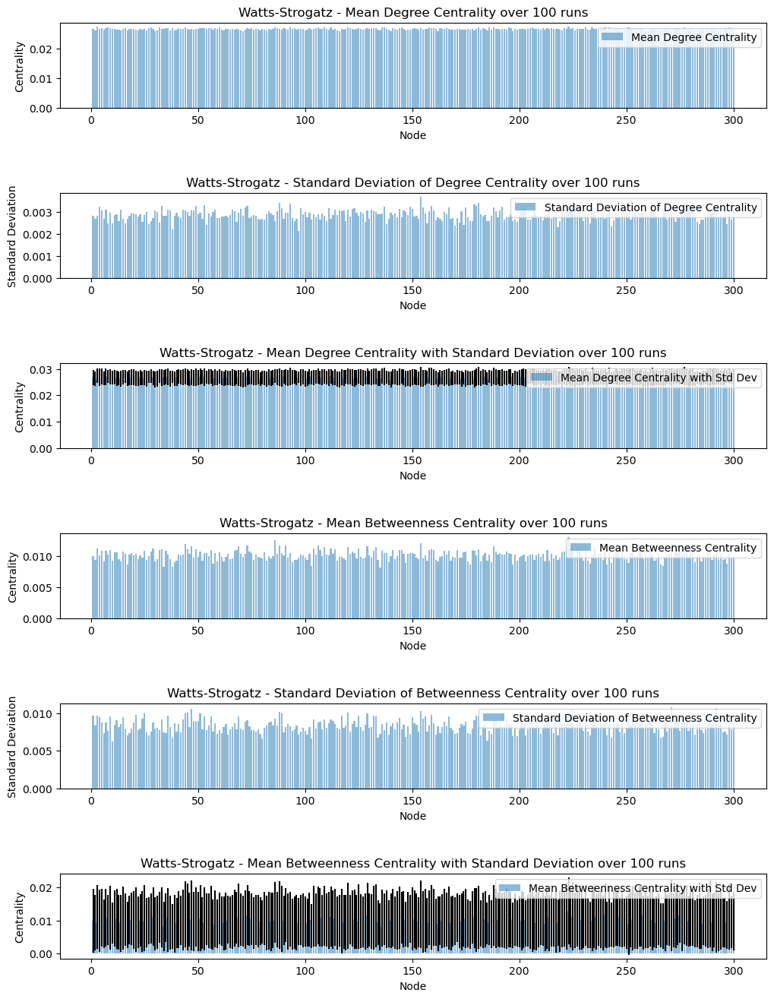

Current number of nearest neighbour attached: 10


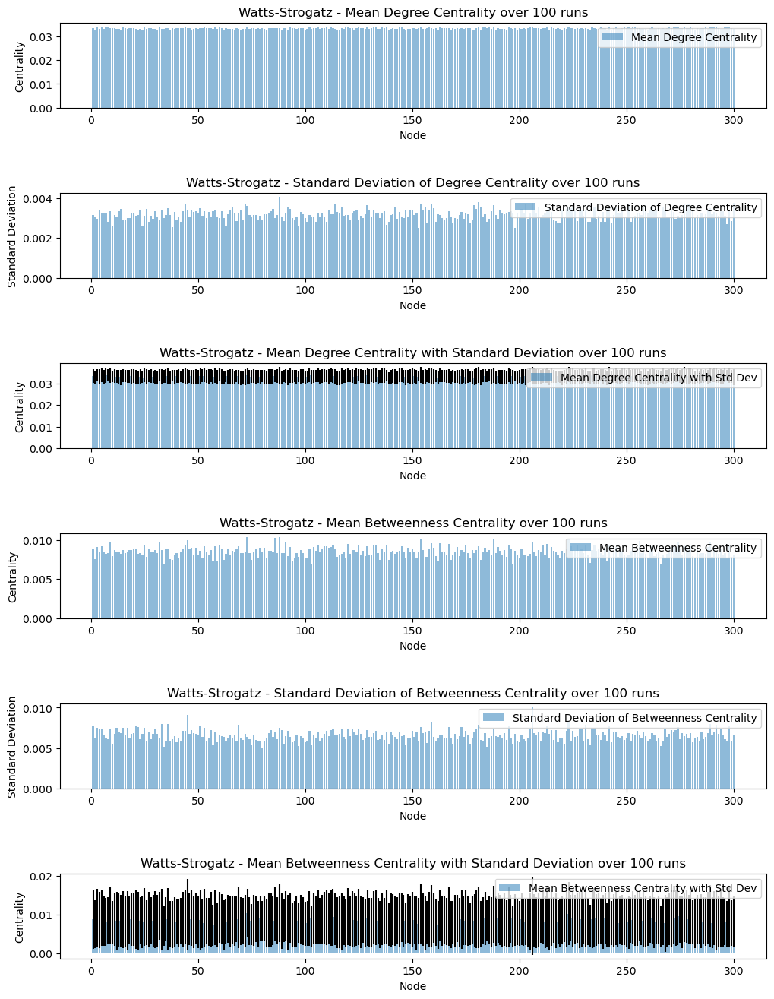

In [38]:
for param in k_param:
    # Generate Watts-Strogatz instances
    ws_instances = generate_ws_instances(num_instances_ws, num_nodes=300, k=param)
    print("Current number of nearest neighbour attached:", param)
    centrality_measures = [calculate_centrality_measures(graph) for graph in ws_instances]
    plot_centrality_measures('Watts-Strogatz', centrality_measures, num_instances_ws)

Current probability to rewire an edge: 0.05


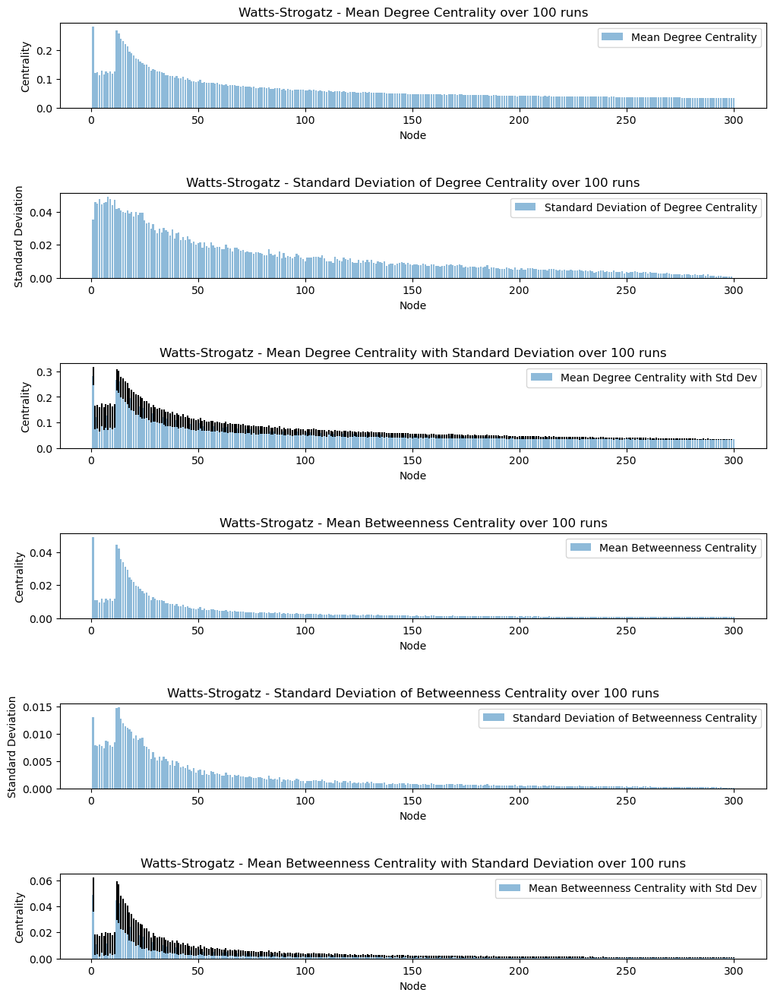

Current probability to rewire an edge: 0.1


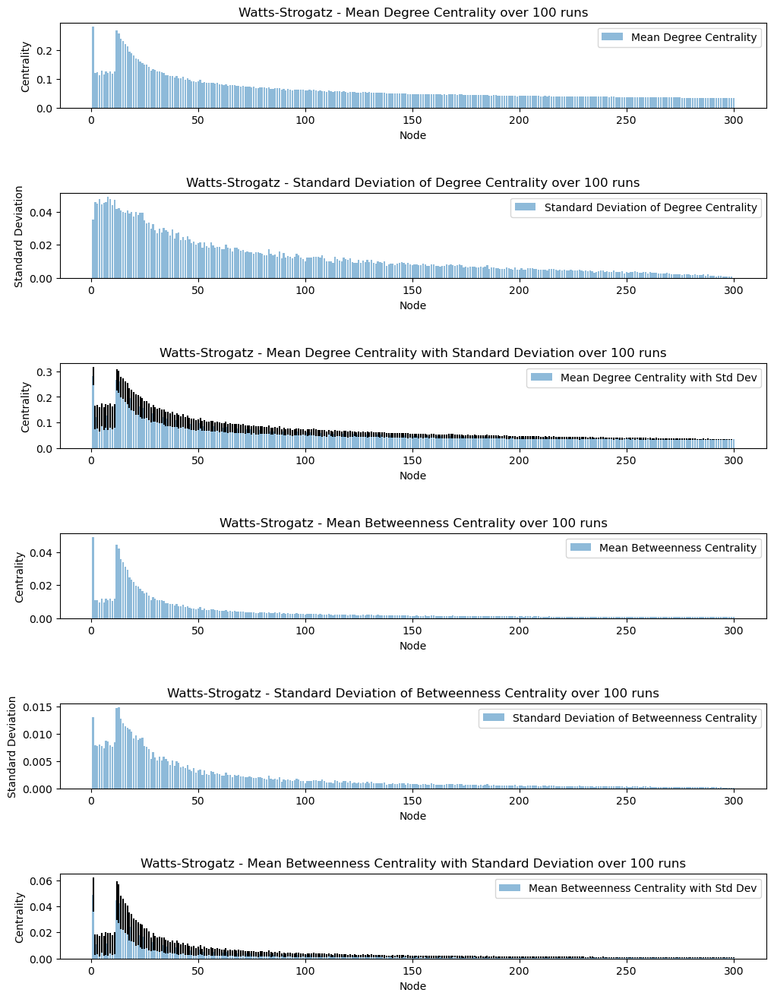

Current probability to rewire an edge: 0.15


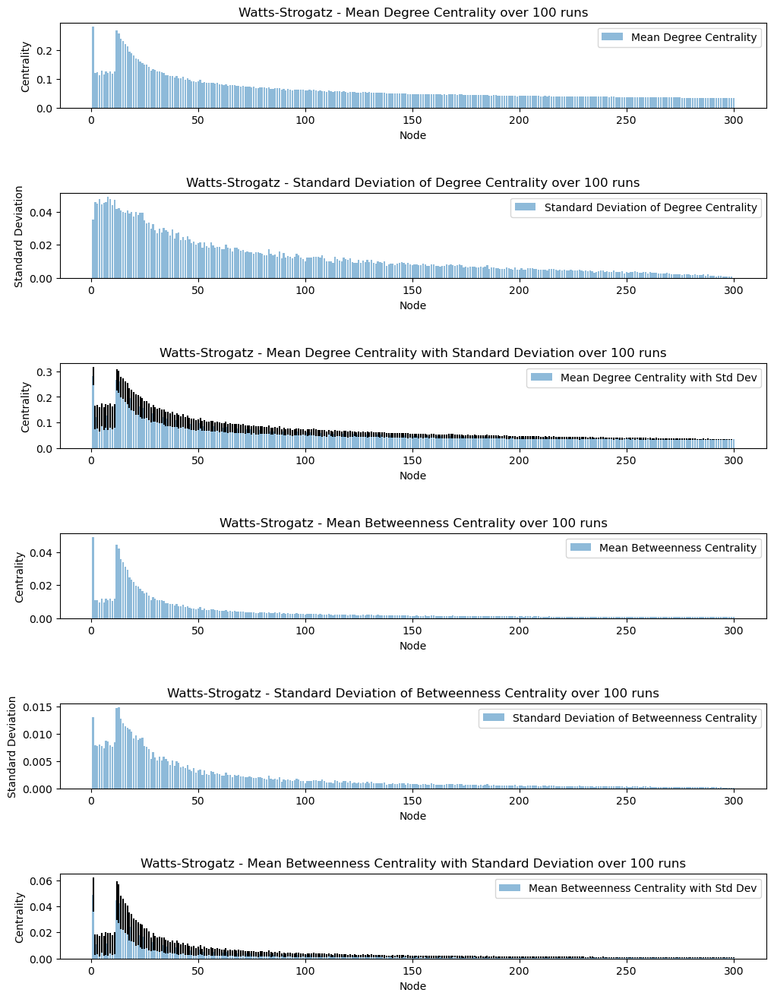

Current probability to rewire an edge: 0.2


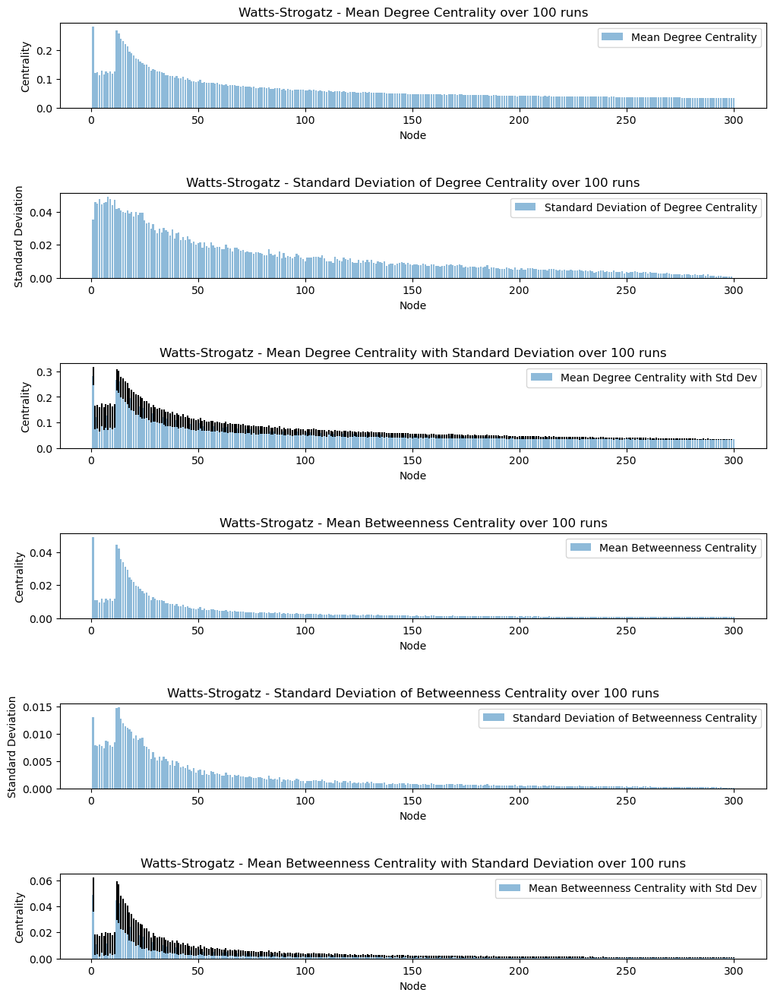

Current probability to rewire an edge: 0.25


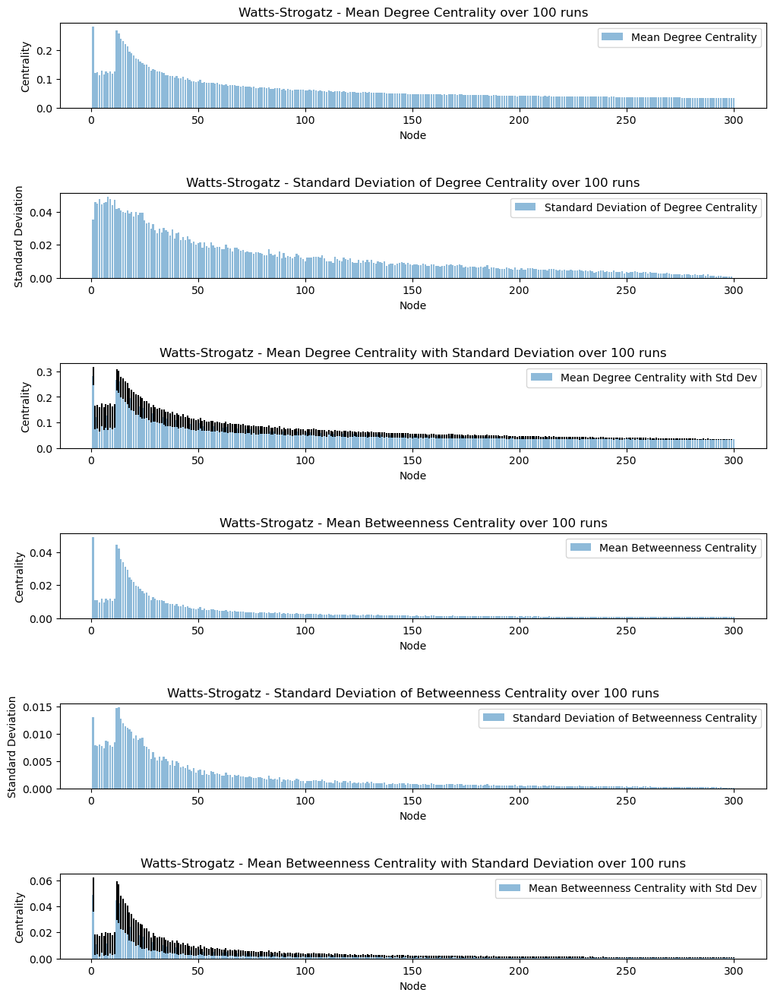

In [39]:
#Varying the p parameter
for param in p_param:
    # Generate Watts-Strogatz instances
    ws_instances = generate_ws_instances(num_instances_ws, num_nodes=300, k=4, p=param)
    print("Current probability to rewire an edge:", param)
    centrality_measures = [calculate_centrality_measures(graph) for graph in ba_instances]
    plot_centrality_measures('Watts-Strogatz', centrality_measures, num_instances_ws)

#### Erdos-Renyi

Current number of nodes: 100


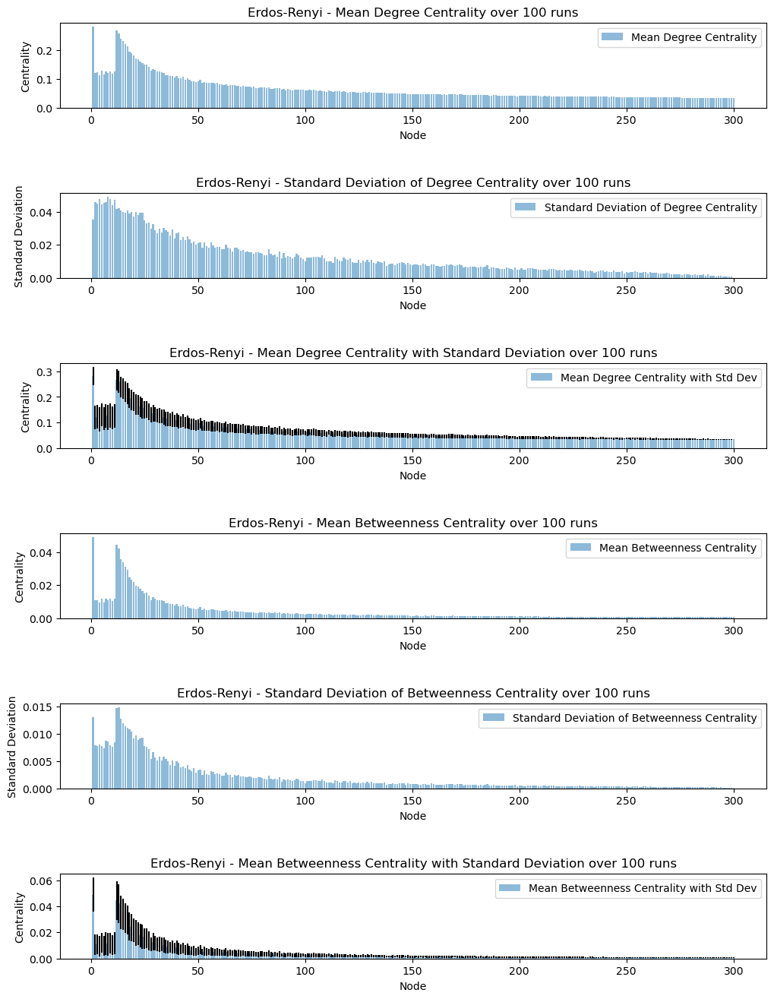

Current number of nodes: 200


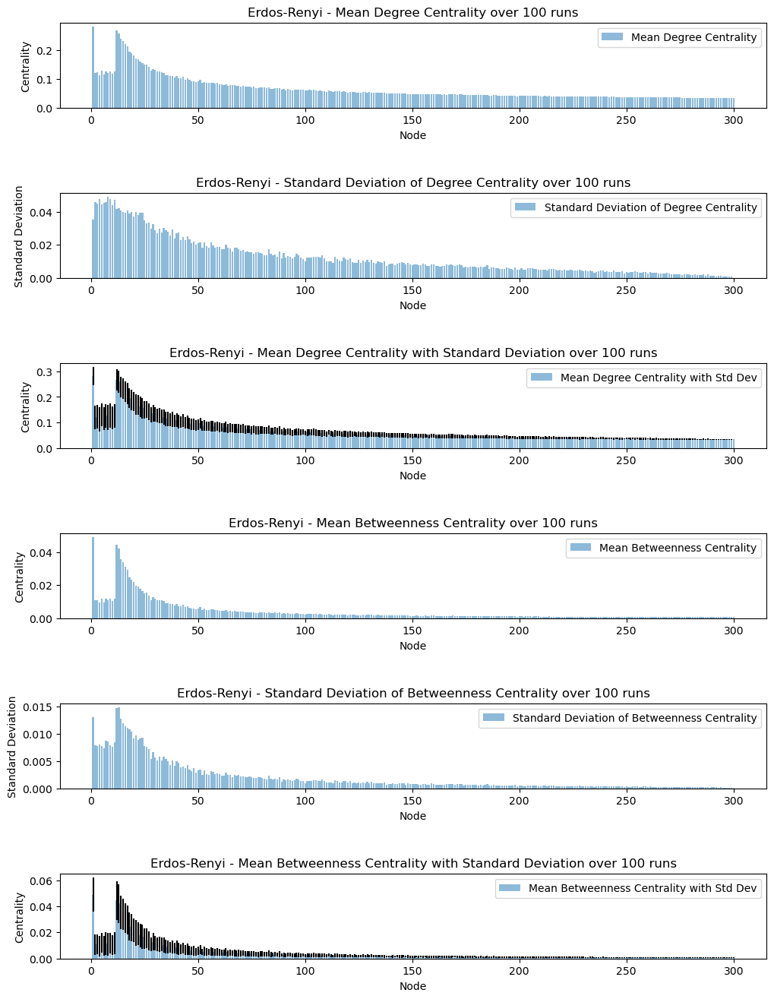

Current number of nodes: 400


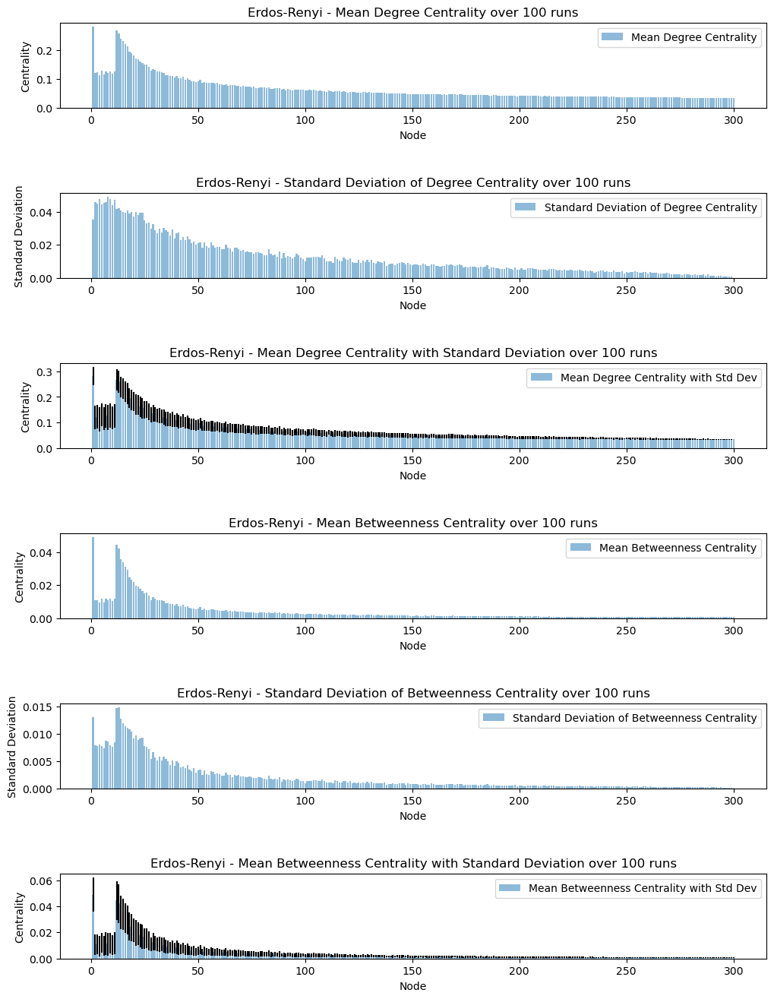

Current number of nodes: 800


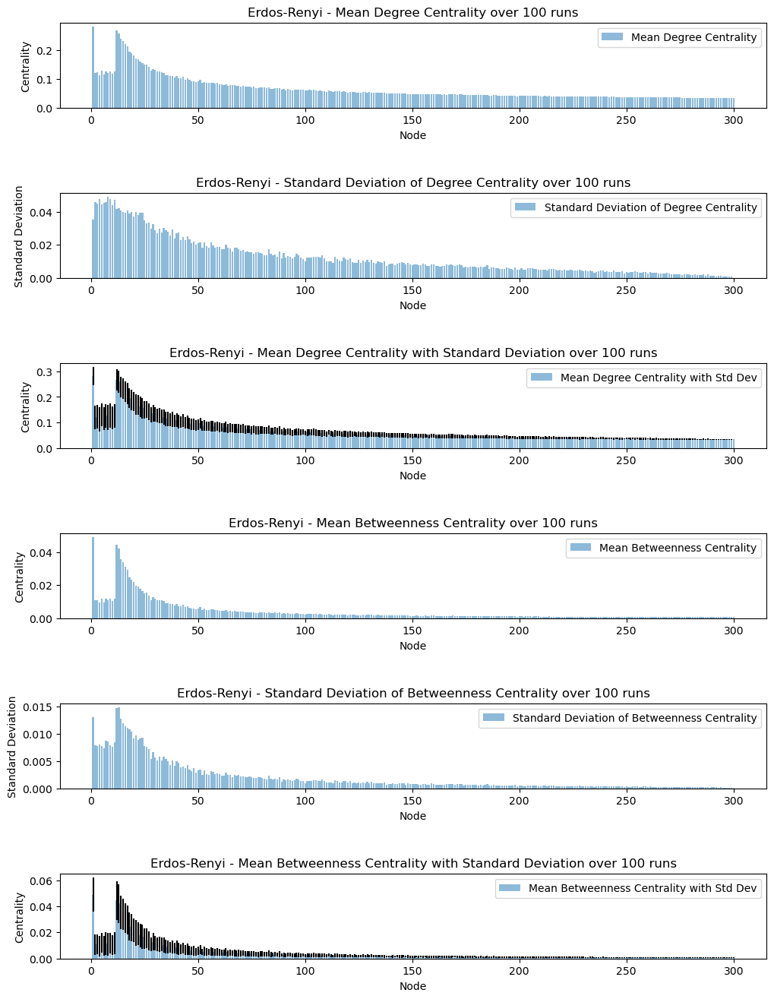

In [40]:
# Varying node count
for param in num_nodes_param:
    # Generate Erdos-Renyi instances
    er_instances = generate_er_instances(num_instances_er, param)
    print("Current number of nodes:", param)   
    centrality_measures = [calculate_centrality_measures(graph) for graph in ba_instances]
    plot_centrality_measures('Erdos-Renyi', centrality_measures, num_instances_er)

Current probability to rewire an edge: 0.05


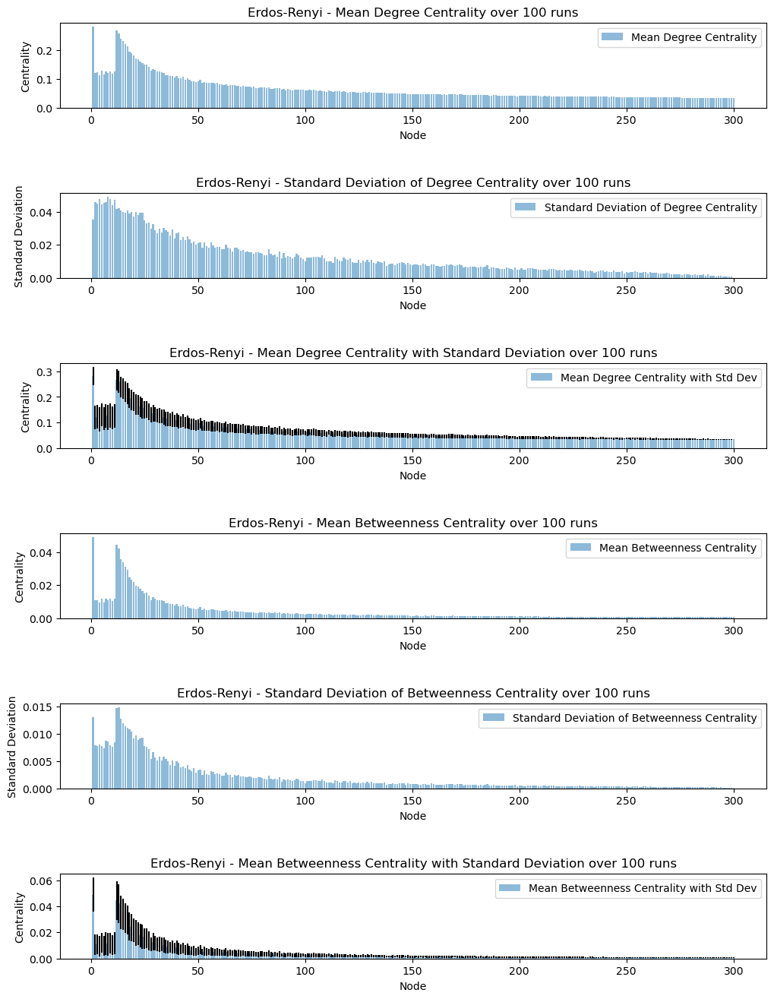

Current probability to rewire an edge: 0.1


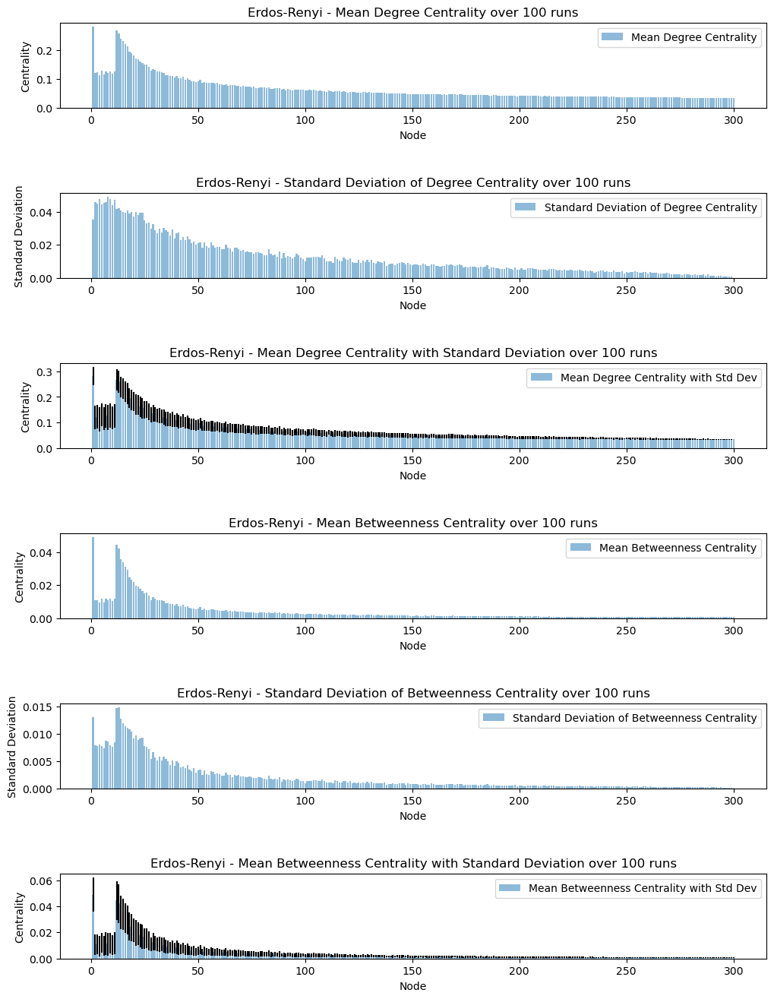

Current probability to rewire an edge: 0.15


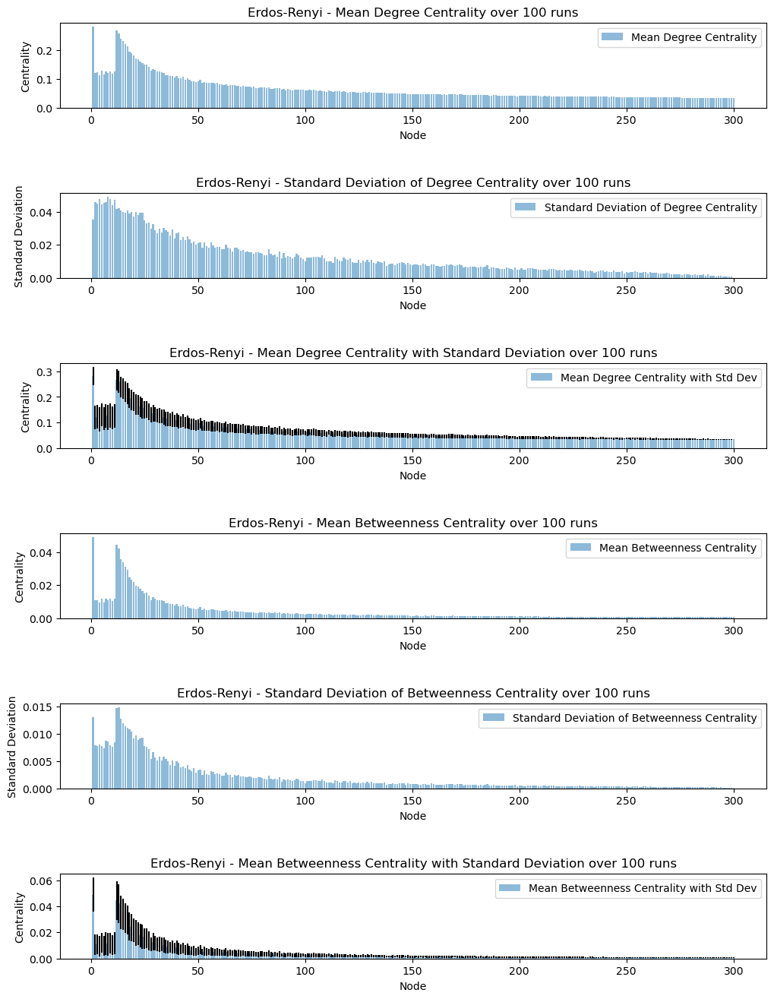

Current probability to rewire an edge: 0.2


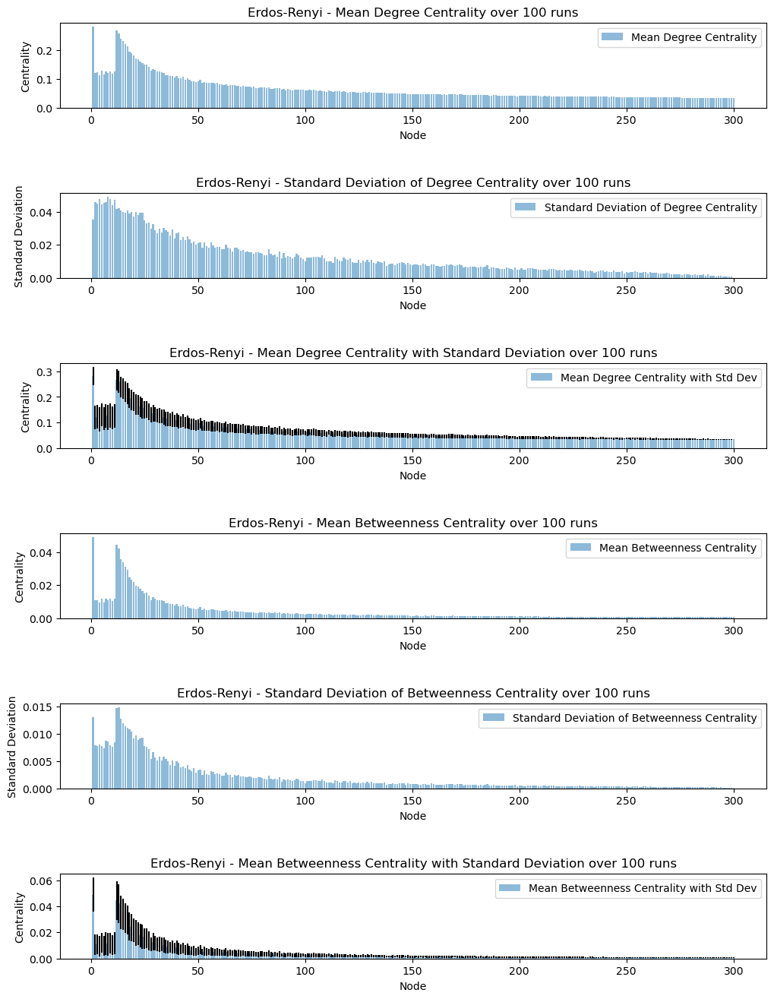

Current probability to rewire an edge: 0.25


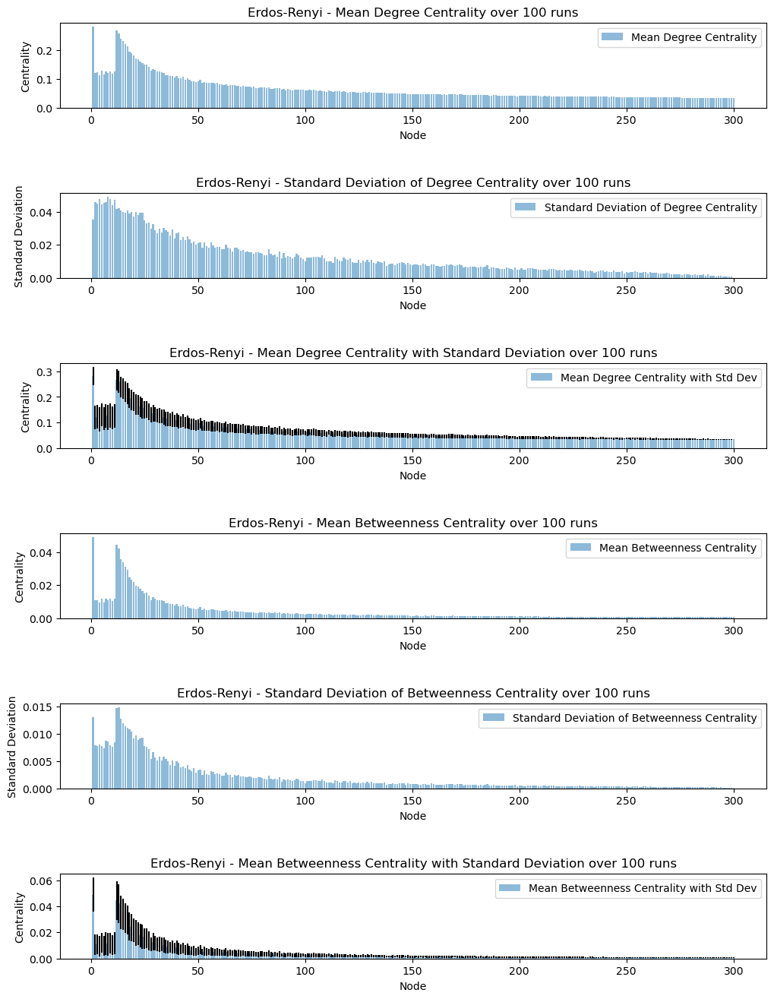

In [41]:
# Varying probability to connect
for param in p_param:
    # Generate Erdos-Renyi instances
    er_instances = generate_er_instances(num_instances_er, num_nodes=300, p=param)
    print("Current probability to rewire an edge:", param)   
    centrality_measures = [calculate_centrality_measures(graph) for graph in ba_instances]
    plot_centrality_measures('Erdos-Renyi', centrality_measures, num_instances_er)

### 2.3 Simulate SIR spread on the network
The next part will be structured as follows: First the network will be simulated where 5% of the network will be infected at random. After that we will infect the top 5% of nodes with the highest degree.

#### Barabasi-Albert

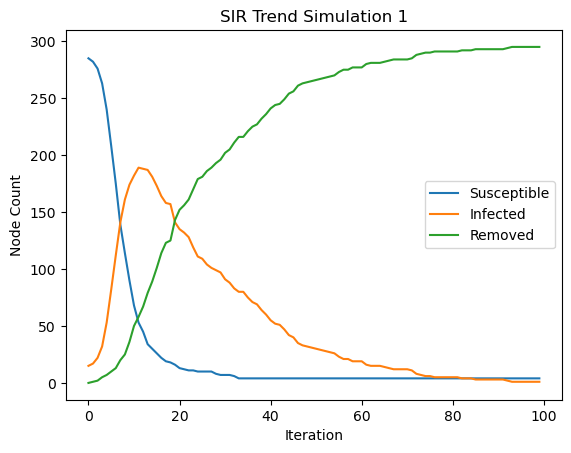

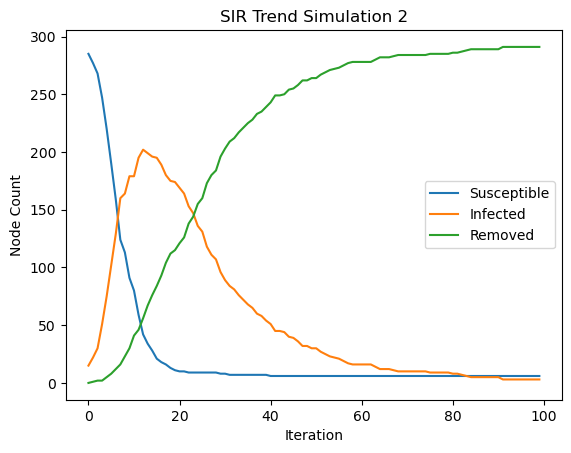

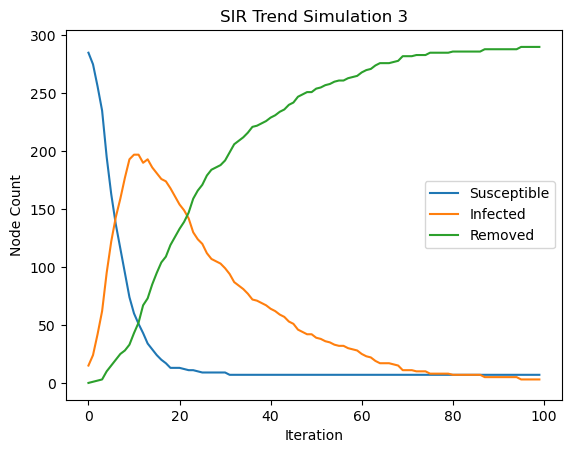

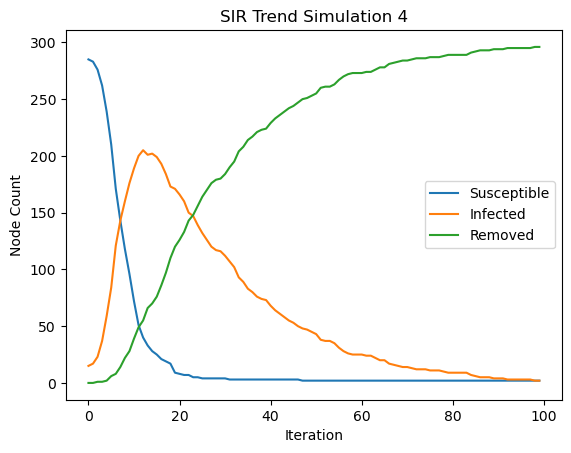

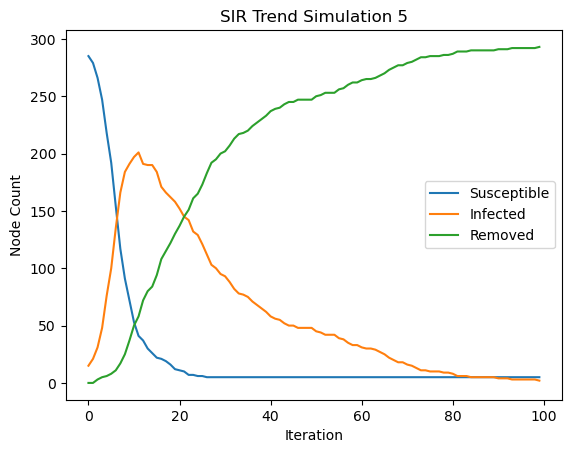

In [42]:
# Randomly select 5% of the network
ba_instances = generate_ba_instances(5)

sim_count = 1
for instance in ba_instances:
    # Initialize the SIR model
    sir_model = ep.SIRModel(instance)

    # Model Configuration
    config = mc.Configuration()
    config.add_model_parameter('beta', 0.1)
    config.add_model_parameter('gamma', 0.05)
    config.add_model_parameter("fraction_infected", 0.05)
    sir_model.set_initial_status(config)
    
    # Execute the model
    iterations = sir_model.iteration_bunch(100)
    trends = sir_model.build_trends(iterations)
    viz = DiffusionTrend(sir_model, trends)
    # plotting the SIR model in matplotlib 
    trends_data = viz.trends
    node_count_data = trends_data[0]['trends']['node_count']
    node_labels = {0: 'Susceptible', 1: 'Infected', 2: 'Removed'}

    for node, counts in node_count_data.items():
        label = node_labels[node]
        plt.plot(counts, label=f'{label}')

    plt.xlabel('Iteration')
    plt.ylabel('Node Count')
    plt.title(f'SIR Trend Simulation {sim_count}')
    plt.legend()
    plt.show()
    sim_count += 1

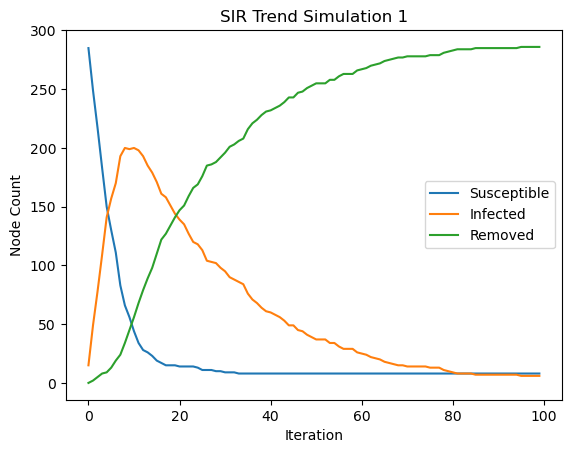

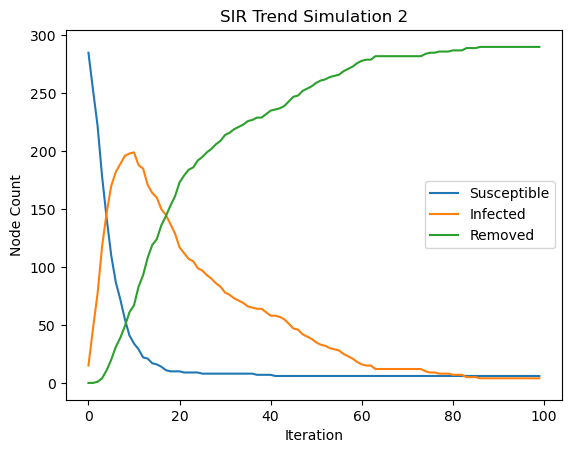

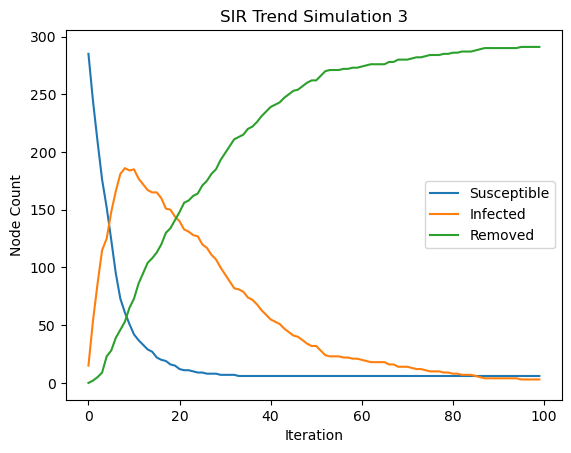

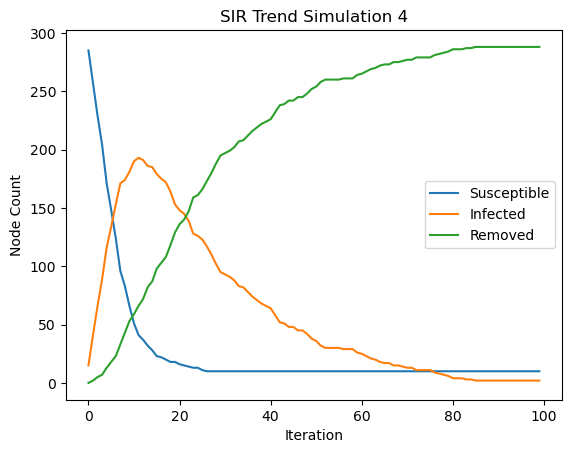

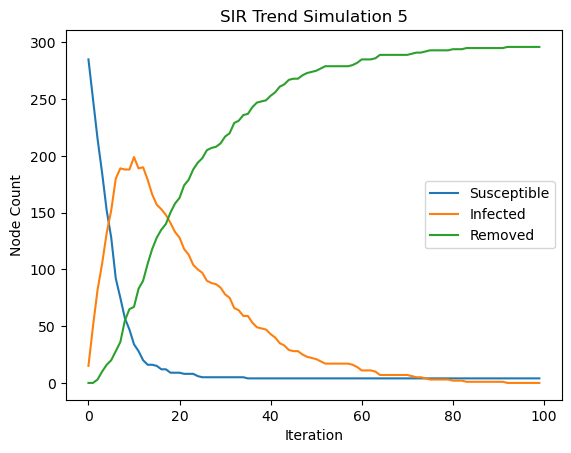

In [43]:
# Select the top 5% of the network
sim_count = 1
for instance in ba_instances:
    # Get a dictionary of nodes and their degrees
    degrees = dict(instance.degree())

    # Sort nodes by degree
    sorted_nodes = sorted(degrees, key=degrees.get, reverse=True)

    # Select the top 5% of nodes
    top_5_percent = int(0.05 * instance.number_of_nodes())
    nodes_to_infect = sorted_nodes[:top_5_percent]

    # Initialize the SIR model
    sir_model = ep.SIRModel(instance)

    # Model Configuration
    config = mc.Configuration()
    config.add_model_parameter('beta', 0.1)
    config.add_model_parameter('gamma', 0.05)

    # Set the initial status of these nodes to infected
    config.add_model_initial_configuration("Infected", nodes_to_infect)

    sir_model.set_initial_status(config)

    # Execute the model
    iterations = sir_model.iteration_bunch(100)
    trends = sir_model.build_trends(iterations)
    viz = DiffusionTrend(sir_model, trends)
    # plotting the SIR model in matplotlib 
    trends_data = viz.trends
    node_count_data = trends_data[0]['trends']['node_count']
    node_labels = {0: 'Susceptible', 1: 'Infected', 2: 'Removed'}

    for node, counts in node_count_data.items():
        label = node_labels[node]
        plt.plot(counts, label=f'{label}')

    plt.xlabel('Iteration')
    plt.ylabel('Node Count')
    plt.title(f'SIR Trend Simulation {sim_count}')
    plt.legend()
    plt.show()
    sim_count += 1

#### Watts-Strogatz

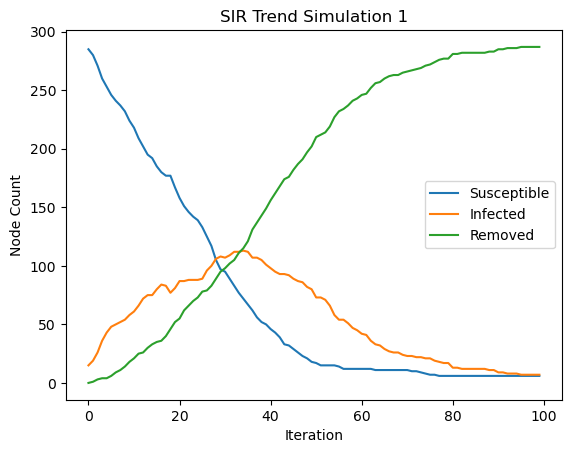

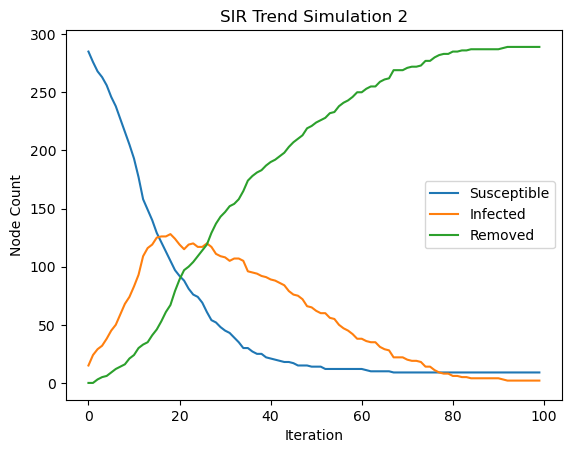

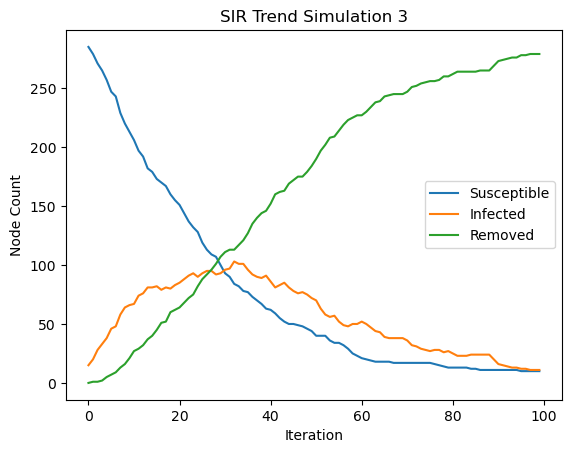

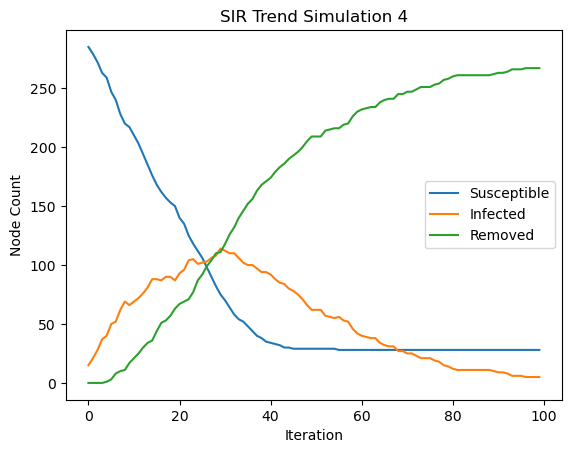

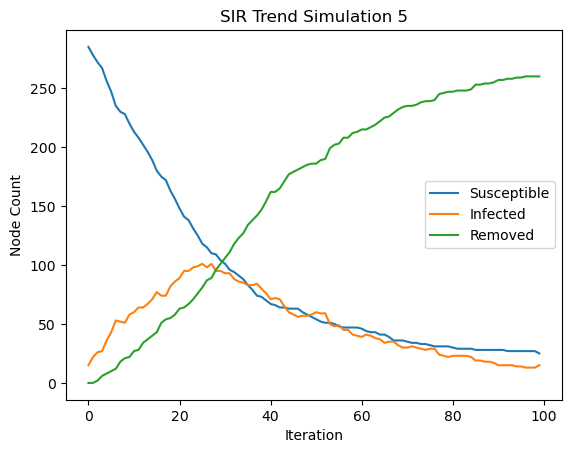

In [44]:
# Randomly select 5% of the network

ws_instances = generate_ws_instances(5)

sim_count = 1
for instance in ws_instances:
    # Initialize the SIR model
    sir_model = ep.SIRModel(instance)

    # Model Configuration
    config = mc.Configuration()
    config.add_model_parameter('beta', 0.1)
    config.add_model_parameter('gamma', 0.05)
    config.add_model_parameter("fraction_infected", 0.05)
    sir_model.set_initial_status(config)
    
    # Execute the model
    iterations = sir_model.iteration_bunch(100)
    trends = sir_model.build_trends(iterations)
    viz = DiffusionTrend(sir_model, trends)
    # plotting the SIR model in matplotlib 
    trends_data = viz.trends
    node_count_data = trends_data[0]['trends']['node_count']
    node_labels = {0: 'Susceptible', 1: 'Infected', 2: 'Removed'}

    for node, counts in node_count_data.items():
        label = node_labels[node]
        plt.plot(counts, label=f'{label}')

    plt.xlabel('Iteration')
    plt.ylabel('Node Count')
    plt.title(f'SIR Trend Simulation {sim_count}')
    plt.legend()
    plt.show()
    sim_count += 1

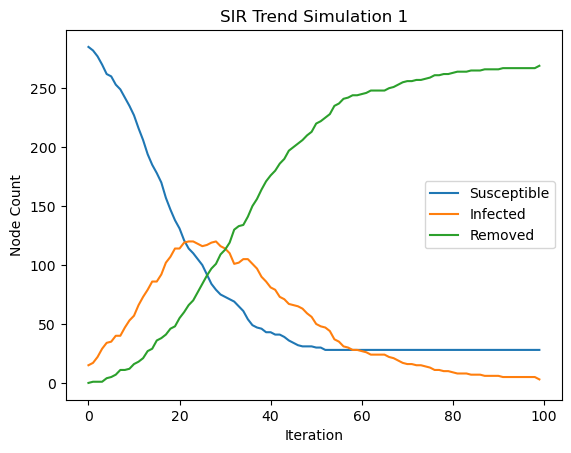

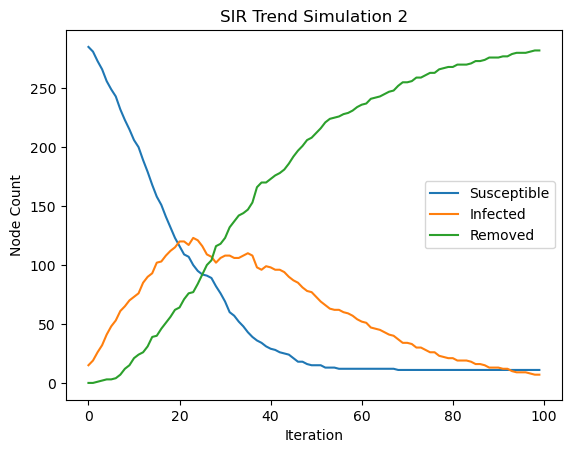

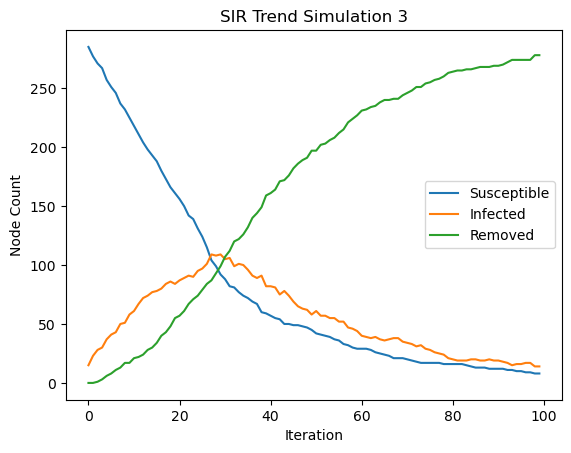

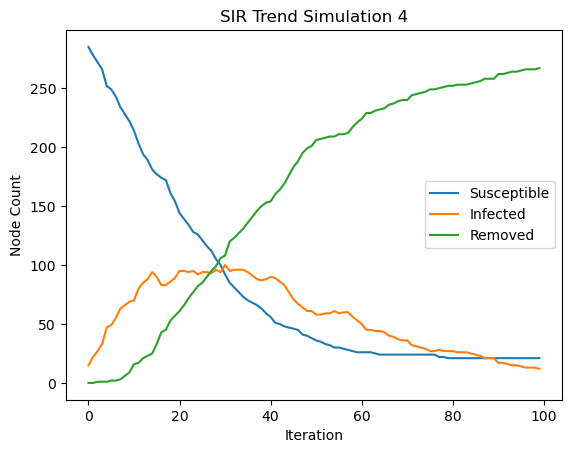

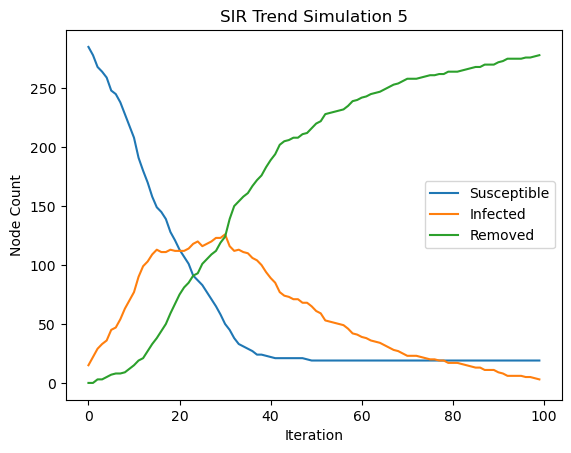

In [45]:
# Select the top 5% of the network
sim_count = 1
for instance in ws_instances:
    # Get a dictionary of nodes and their degrees
    degrees = dict(instance.degree())

    # Sort nodes by degree
    sorted_nodes = sorted(degrees, key=degrees.get, reverse=True)

    # Select the top 5% of nodes
    top_5_percent = int(0.05 * instance.number_of_nodes())
    nodes_to_infect = sorted_nodes[:top_5_percent]

    # Initialize the SIR model
    sir_model = ep.SIRModel(instance)

    # Model Configuration
    config = mc.Configuration()
    config.add_model_parameter('beta', 0.1)
    config.add_model_parameter('gamma', 0.05)

    # Set the initial status of these nodes to infected
    config.add_model_initial_configuration("Infected", nodes_to_infect)

    sir_model.set_initial_status(config)

    # Execute the model
    iterations = sir_model.iteration_bunch(100)
    trends = sir_model.build_trends(iterations)
    viz = DiffusionTrend(sir_model, trends)
    # plotting the SIR model in matplotlib 
    trends_data = viz.trends
    node_count_data = trends_data[0]['trends']['node_count']
    node_labels = {0: 'Susceptible', 1: 'Infected', 2: 'Removed'}

    for node, counts in node_count_data.items():
        label = node_labels[node]
        plt.plot(counts, label=f'{label}')

    plt.xlabel('Iteration')
    plt.ylabel('Node Count')
    plt.title(f'SIR Trend Simulation {sim_count}')
    plt.legend()
    plt.show()
    sim_count += 1

#### Erdos-Renyi

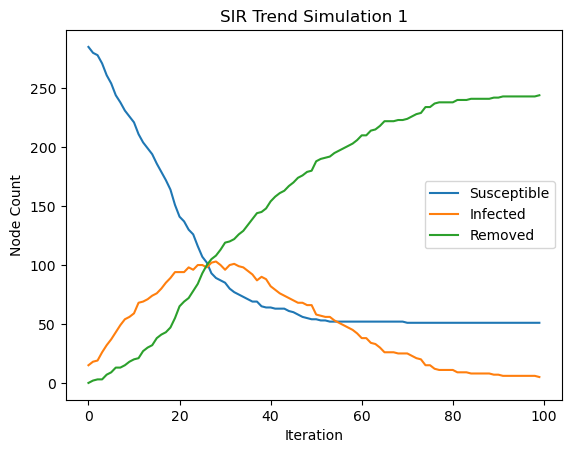

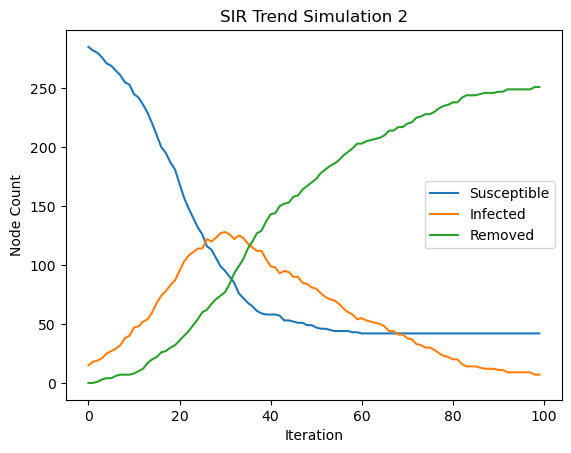

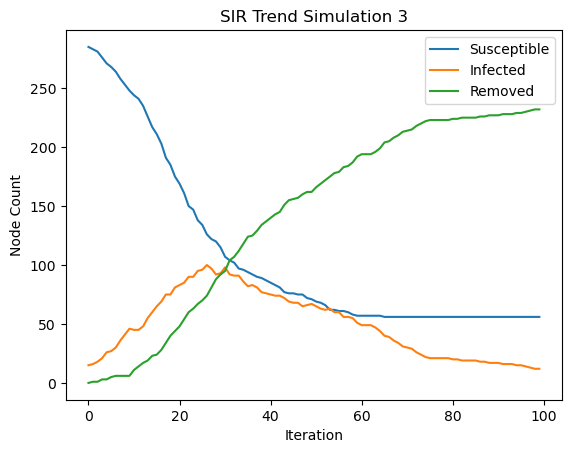

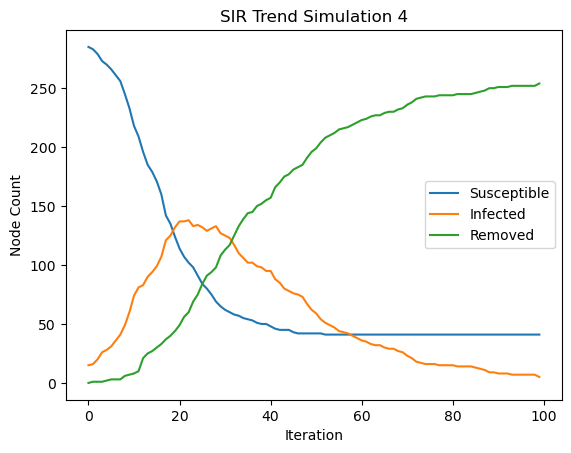

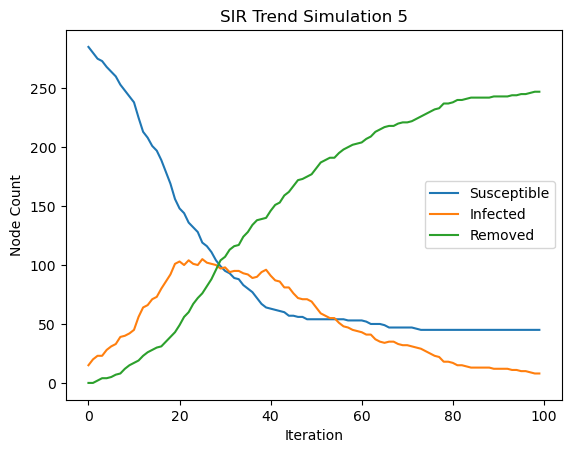

In [46]:
# Randomly select 5% of the network

er_instances = generate_er_instances(5, p=0.01)

sim_count = 1
for instance in er_instances:
    # Initialize the SIR model
    sir_model = ep.SIRModel(instance)

    # Model Configuration
    config = mc.Configuration()
    config.add_model_parameter('beta', 0.1)
    config.add_model_parameter('gamma', 0.05)
    config.add_model_parameter("fraction_infected", 0.05)
    sir_model.set_initial_status(config)
    
    # Execute the model
    iterations = sir_model.iteration_bunch(100)
    trends = sir_model.build_trends(iterations)
    viz = DiffusionTrend(sir_model, trends)
    # plotting the SIR model in matplotlib 
    trends_data = viz.trends
    node_count_data = trends_data[0]['trends']['node_count']
    node_labels = {0: 'Susceptible', 1: 'Infected', 2: 'Removed'}

    for node, counts in node_count_data.items():
        label = node_labels[node]
        plt.plot(counts, label=f'{label}')

    plt.xlabel('Iteration')
    plt.ylabel('Node Count')
    plt.title(f'SIR Trend Simulation {sim_count}')
    plt.legend()
    plt.show()
    sim_count += 1

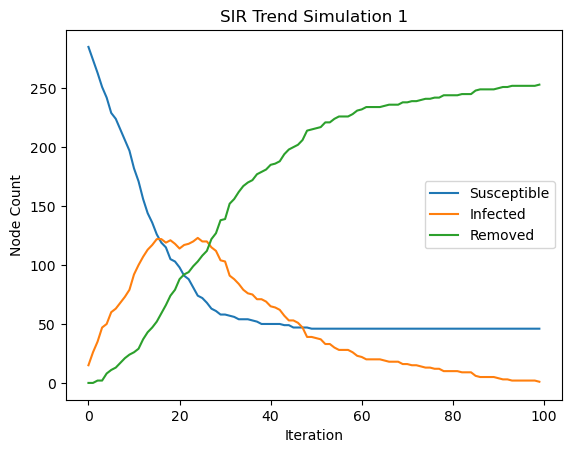

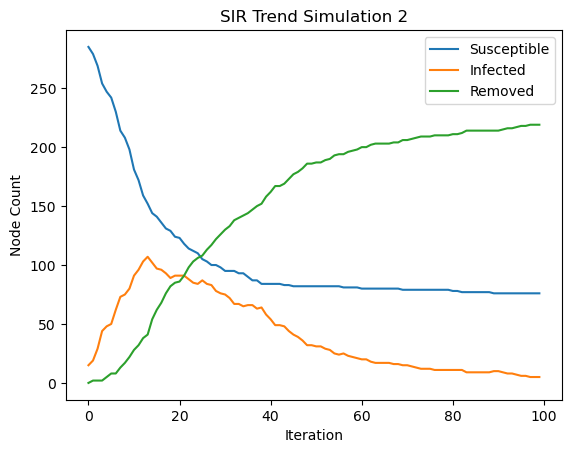

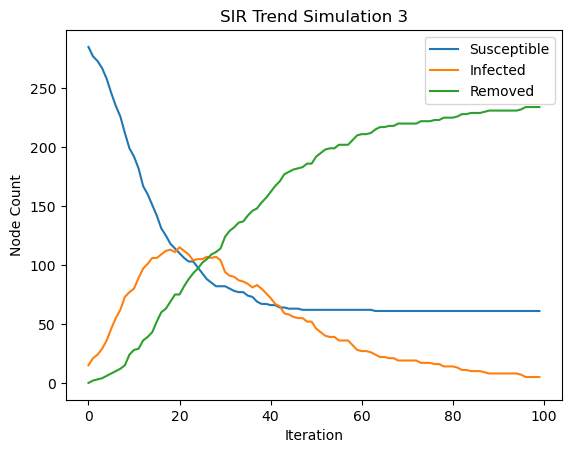

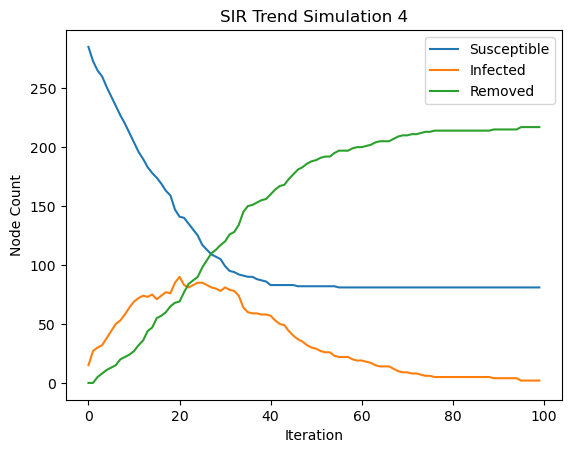

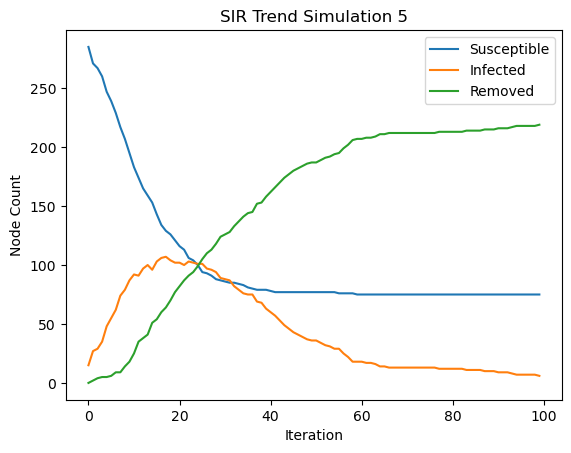

In [47]:
# Select the top 5% of the network
sim_count = 1
for instance in er_instances:
    # Get a dictionary of nodes and their degrees
    degrees = dict(instance.degree())

    # Sort nodes by degree
    sorted_nodes = sorted(degrees, key=degrees.get, reverse=True)

    # Select the top 5% of nodes
    top_5_percent = int(0.05 * instance.number_of_nodes())
    nodes_to_infect = sorted_nodes[:top_5_percent]

    # Initialize the SIR model
    sir_model = ep.SIRModel(instance)

    # Model Configuration
    config = mc.Configuration()
    config.add_model_parameter('beta', 0.1)
    config.add_model_parameter('gamma', 0.05)

    # Set the initial status of these nodes to infected
    config.add_model_initial_configuration("Infected", nodes_to_infect)

    sir_model.set_initial_status(config)

    # Execute the model
    iterations = sir_model.iteration_bunch(100)
    trends = sir_model.build_trends(iterations)
    viz = DiffusionTrend(sir_model, trends)
    # plotting the SIR model in matplotlib 
    trends_data = viz.trends
    node_count_data = trends_data[0]['trends']['node_count']
    node_labels = {0: 'Susceptible', 1: 'Infected', 2: 'Removed'}

    for node, counts in node_count_data.items():
        label = node_labels[node]
        plt.plot(counts, label=f'{label}')

    plt.xlabel('Iteration')
    plt.ylabel('Node Count')
    plt.title(f'SIR Trend Simulation {sim_count}')
    plt.legend()
    plt.show()
    sim_count += 1

### 2.4 Dynamic Vaccination Campaign

In [48]:
# We had issues here getting the graph to work using nx.from_edgelist
# so we did it in a roundabout way through pandas

# Load the data
df = pd.read_csv('transmission_network.csv', delimiter=';', header=0)

G = nx.Graph()

# Extract node labels from the 'Unnamed: 0' column
node_labels = df['Unnamed: 0'].tolist()

# Add all nodes to the graph first
G.add_nodes_from(node_labels)

# Iterate over each row to add edges
for idx, row in df.iterrows():
    source_node = row['Unnamed: 0']
    # Iterate over the upper triangle only
    for col_idx in range(idx + 1, len(node_labels)):
        edge_weight = row.iloc[col_idx]  
        if edge_weight != 0:  # assuming non-zero values indicate an edge
            G.add_edge(source_node, node_labels[col_idx])

print(G)


Graph with 374 nodes and 1265 edges


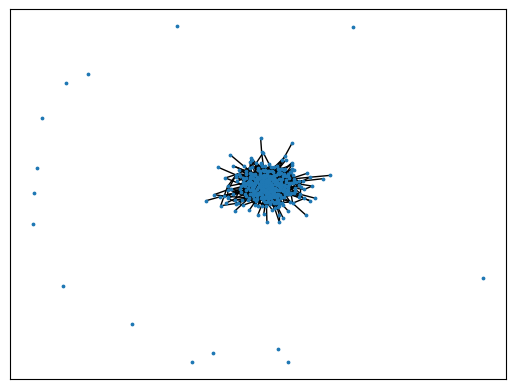

In [49]:
# Visualizing the graph
layout = nx.draw_networkx(G, node_size = 3, with_labels = False)
layout

In [50]:
node_degrees = dict(G.degree())

# Find the maximum degree
max_degree = max(node_degrees.values())

print(f"The maximum degree of the nodes in the graph is: {max_degree}")

The maximum degree of the nodes in the graph is: 38


In [51]:
# Checking how connected nodes the top nodes are

# Get a dictionary of nodes and their degrees
degrees = dict(G.degree())

# Sort nodes by degree
sorted_nodes = sorted(degrees, key=degrees.get, reverse=True)

# Select the top 5% of nodes
top_5_percent = int(0.05 * instance.number_of_nodes())
nodes_to_infect = sorted_nodes[:top_5_percent]

for nodes in nodes_to_infect:
    print(f"Degree of node {nodes} is", degrees[nodes])

Degree of node 1599 is 38
Degree of node 1441 is 34
Degree of node 1598 is 32
Degree of node 1903 is 29
Degree of node 1703 is 27
Degree of node 1525 is 25
Degree of node 1519 is 25
Degree of node 1655 is 25
Degree of node 1544 is 24
Degree of node 1600 is 22
Degree of node 1489 is 22
Degree of node 1857 is 21
Degree of node 1767 is 21
Degree of node 1531 is 20
Degree of node 1463 is 20


In [52]:
# Comment this out to introduce stochasticity in the code
np.random.seed(10)

### Letting the disease play out naturally

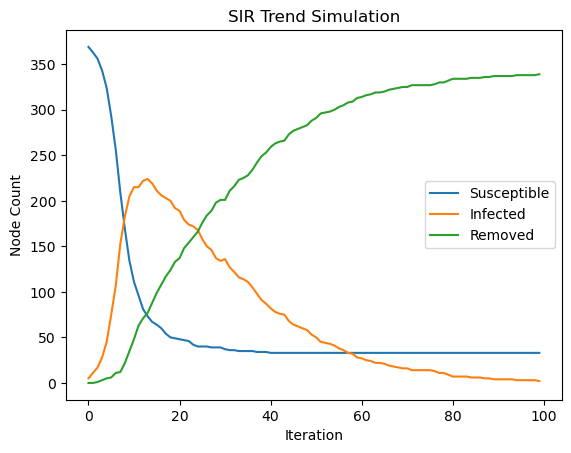

In [53]:
sir_model = ep.SIRModel(G)

# Model Configuration
config = mc.Configuration()
config.add_model_parameter('beta', 0.1)
config.add_model_parameter('gamma', 0.05)

# Randomly infect 5 nodes
random_indices = np.random.choice(G.number_of_nodes(), 5, replace=False)
nodes_to_infect = [list(G.nodes())[i] for i in random_indices]
config.add_model_initial_configuration("Infected", nodes_to_infect)
sir_model.set_initial_status(config)

# Execute the model
iterations = sir_model.iteration_bunch(100)
layout = nx.draw_networkx(G, node_size=3, with_labels=False)
plt.close() 

trends = sir_model.build_trends(iterations)
viz = DiffusionTrend(sir_model, trends)
# plotting the SIR model in matplotlib 
trends_data = viz.trends
node_count_data = trends_data[0]['trends']['node_count']
node_labels = {0: 'Susceptible', 1: 'Infected', 2: 'Removed'}

for node, counts in node_count_data.items():
    label = node_labels[node]
    plt.plot(counts, label=f'{label}')

plt.xlabel('Iteration')
plt.ylabel('Node Count')
plt.title(f'SIR Trend Simulation')
plt.legend()
plt.show()

### Null strategy:Random Vaccination

In [54]:
def null_vaccination(G, vac_total, testing_acc, sir_model):
    """
    Simulate a vaccination strategy where individuals are tested and vaccinated based on their susceptibility.
    The function selects 'vac_total' individuals randomly from the susceptible population, performs a test on each
    individual, and vaccinates them if they are both susceptible and pass the test.

    Parameters:
    - G: NetworkX graph
    - vac_total: int
        The total number of vaccinations that can be administered in this iteration.
    - testing_acc: float
        The accuracy of the testing process, ranging from 0 to 1.
    - sir_model: EpidemicModel
        An instance of an epidemic.  
    """
    susceptible_nodes = []
    for node in G.nodes():
        if sir_model.status[node] == 0:
            susceptible_nodes.append(node)
    
    if len(susceptible_nodes) <= vac_total:
        return []  # No susceptible nodes left, return an empty list
    
    nodes_to_vaccinate = []
    for _ in range(vac_total):
        # Randomly select a node from the network
        random_node = np.random.choice(G.nodes())
        # Roll a random dice to determine testing accuracy
        if random_node in susceptible_nodes and np.random.random() <= testing_acc:
            # Vaccinate the node only if it passes the test (i.e., is susceptible)
            sir_model.status[random_node] = 2  # Set status to "Removed" (vaccinated)
            susceptible_nodes.remove(random_node)

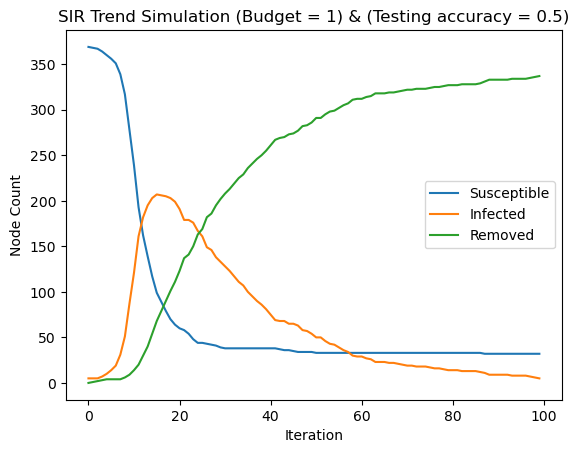

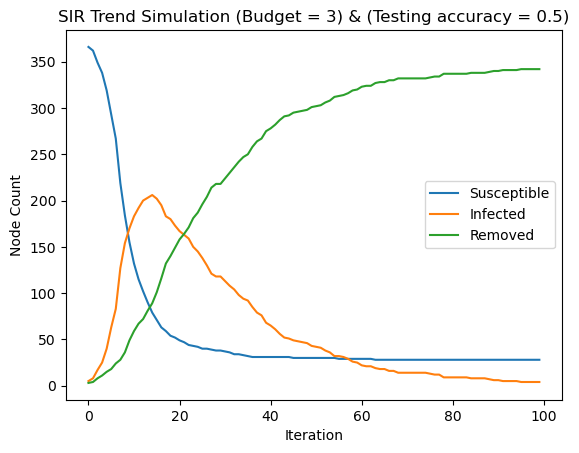

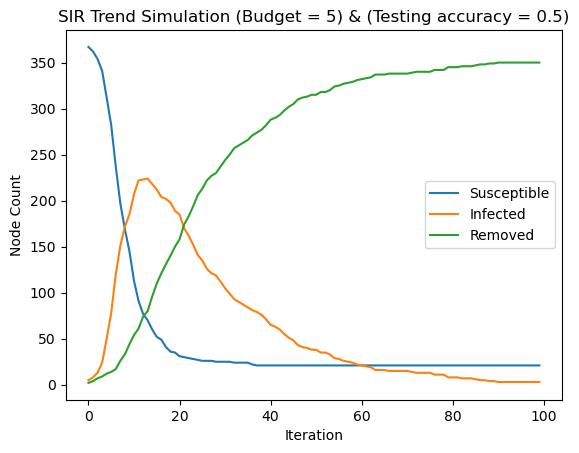

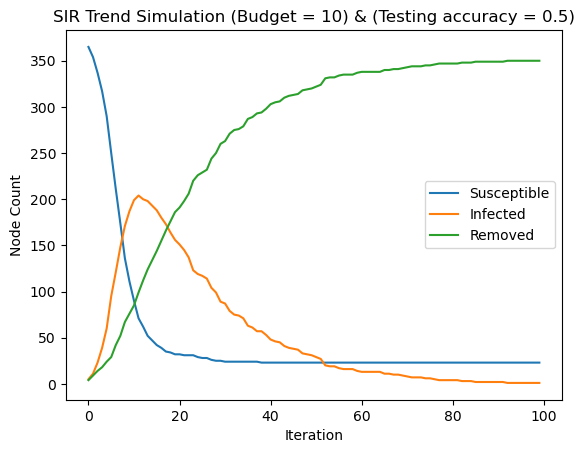

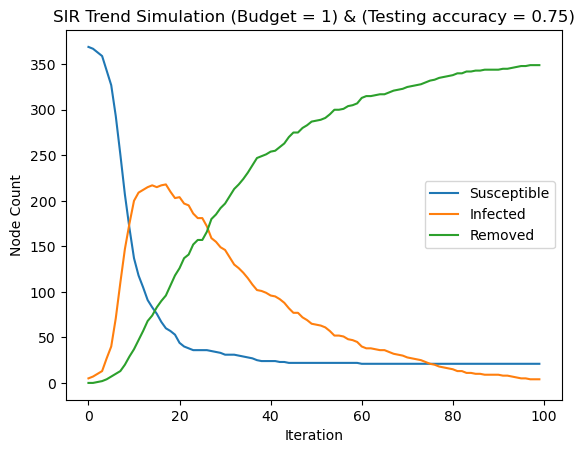

...

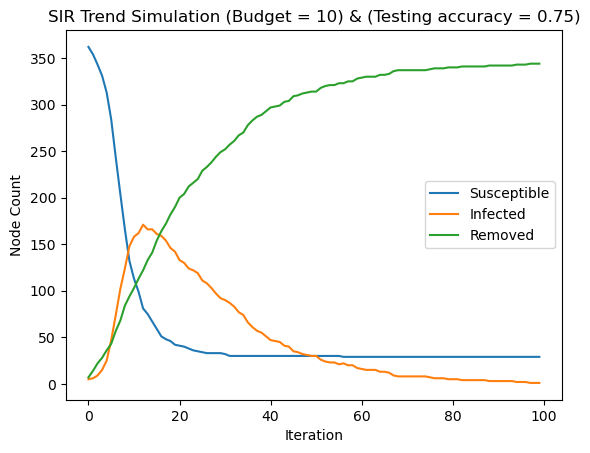

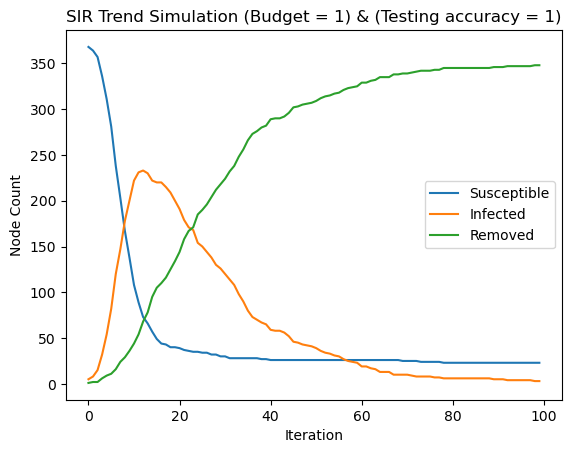

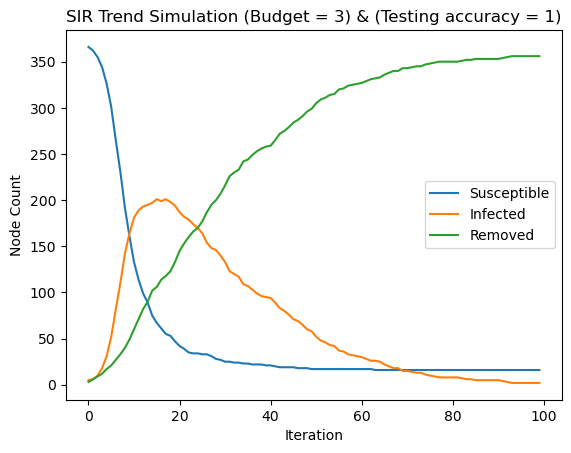

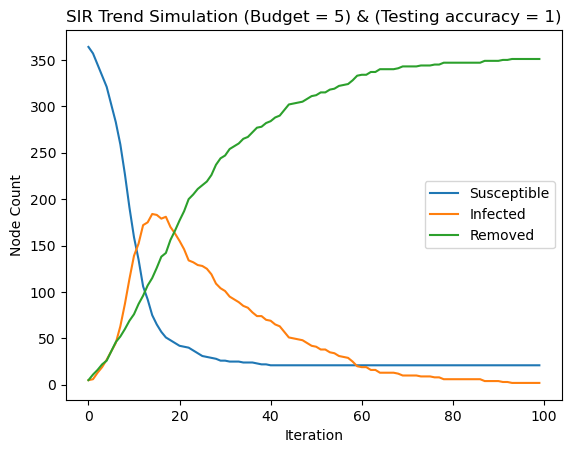

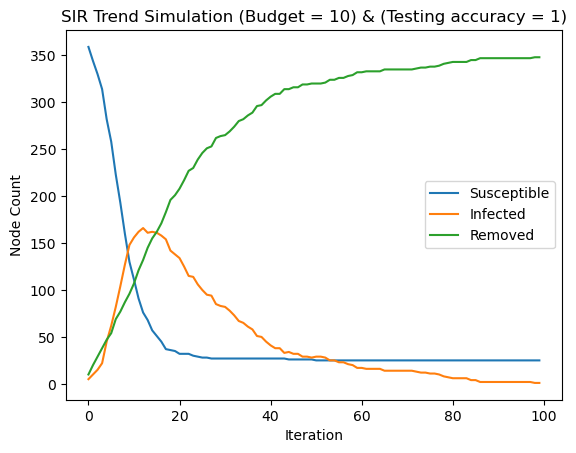

In [55]:
# Maximum vaccination budget
max_vaccinations = 200
timestep_budget = [1, 3, 5, 10]
# Test Accuracy
test_accuracy = [0.5, 0.75, 1]

# different budgets
for accuracy in test_accuracy:
    # different budgets
    for budget in timestep_budget:
        # Initialize SIR model again each loop
        sir_model = ep.SIRModel(G)

        # Model Configuration
        config = mc.Configuration()
        config.add_model_parameter('beta', 0.1)
        config.add_model_parameter('gamma', 0.05)

        # Randomly infect 5 nodes
        random_indices = np.random.choice(G.number_of_nodes(), 5, replace=False)
        nodes_to_infect = [list(G.nodes())[i] for i in random_indices]
        config.add_model_initial_configuration("Infected", nodes_to_infect)
        sir_model.set_initial_status(config)

        # Execute the model with vaccination every iteration
        num_iterations = 100
        # Initialize counts 
        counts = {'Susceptible': [], 'Infected': [], 'Removed': []}

        # Tracking vaccination budget used
        current_vaccination = 0
        # Loop for num_iterations
        for i in range(num_iterations):
            # Apply vaccination at the beginning of each iteration
            if (current_vaccination + budget) < max_vaccinations:
                nodes_to_vaccinate = null_vaccination(G, budget, accuracy, sir_model)  # Vaccinate x nodes 
                current_vaccination += budget
            # Execute the SIR model for one iteration
            iteration = sir_model.iteration()

            # Count the number of nodes in each status
            susceptible_count = 0
            infected_count = 0
            removed_count = 0

            for node in sir_model.status:
                if sir_model.status[node] == 0:
                    susceptible_count += 1
                elif sir_model.status[node] == 1:
                    infected_count += 1
                elif sir_model.status[node] == 2:
                    removed_count += 1

            # Store the counts in the counts dictionary
            counts['Susceptible'].append(susceptible_count)
            counts['Infected'].append(infected_count)
            counts['Removed'].append(removed_count)

        # Plot the trends for this budget
        iterations = range(num_iterations)
        for label, label_counts in counts.items():
            plt.plot(iterations, label_counts, label=label)

        plt.xlabel('Iteration')
        plt.ylabel('Node Count')
        plt.title(f'SIR Trend Simulation (Budget = {budget}) & (Testing accuracy = {accuracy})')
        plt.legend()
        plt.show()

### Neighbor vaccination strategy

In [56]:
def neighbor_vaccination(G, vac_total, testing_acc, sir_model):
    """
    Simulate a neighbor-based vaccination strategy where individuals and their neighbors are 
    tested and vaccinated based on their susceptibility.
    The function selects 'vac_total' individuals randomly from the network,
    performs a test on each individual and their neighbors and vaccinates them if they are both susceptible and pass the test.

    Parameters:
    - G: NetworkX graph
    - vac_total: int
        The total number of vaccinations that can be administered in this iteration.
    - testing_acc: float
        The accuracy of the testing process, ranging from 0 to 1.
    - sir_model: EpidemicModel
        An instance of an epidemic.
    """
    susceptible_nodes = []
    for node in G.nodes():
        if sir_model.status[node] == 0:
            susceptible_nodes.append(node)

    if len(susceptible_nodes) <= vac_total:
        return []  # No susceptible nodes left, return an empty list

    nodes_to_vaccinate = []
    for _ in range(vac_total):
        # Randomly select a node from the network
        random_node = np.random.choice(G.nodes())
        # Get the neighbors of the random node
        neighbors = list(G.neighbors(random_node))
        # Include the random node itself for testing
        nodes_to_test = [random_node] + neighbors
        # Roll a random dice to determine testing accuracy
            # Vaccinate the nodes only if they pass the test (i.e., are susceptible)
        for node in nodes_to_test:
            if node in susceptible_nodes and np.random.random() <= testing_acc:
                sir_model.status[node] = 2  # Set status to "Removed" (vaccinated)
                susceptible_nodes.remove(node)

    return nodes_to_vaccinate

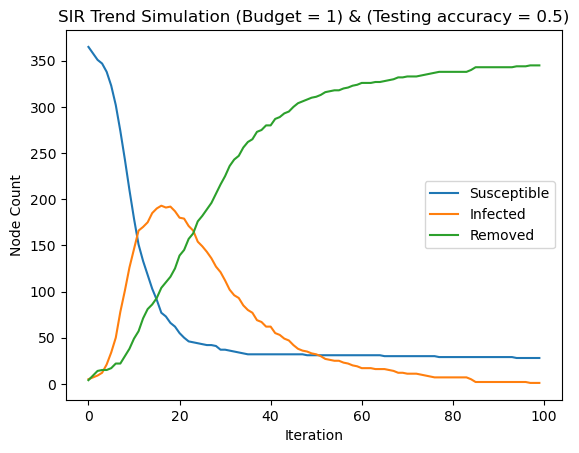

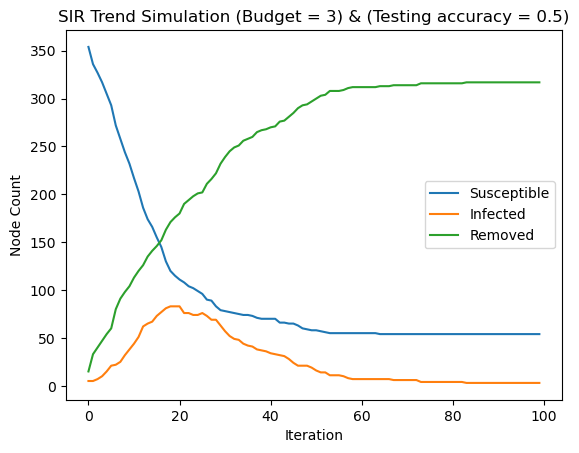

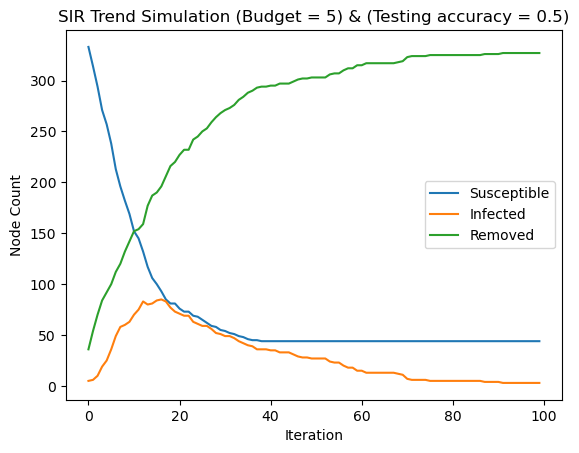

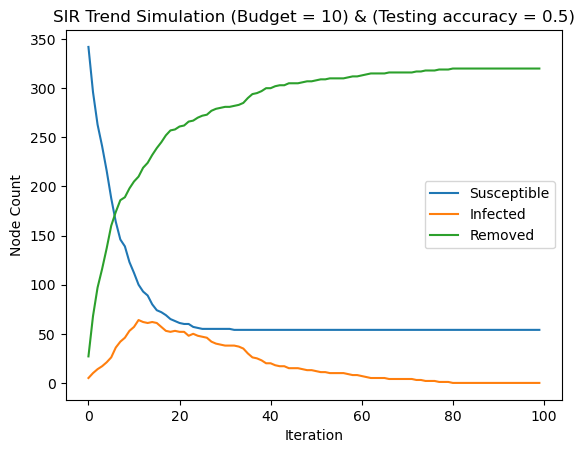

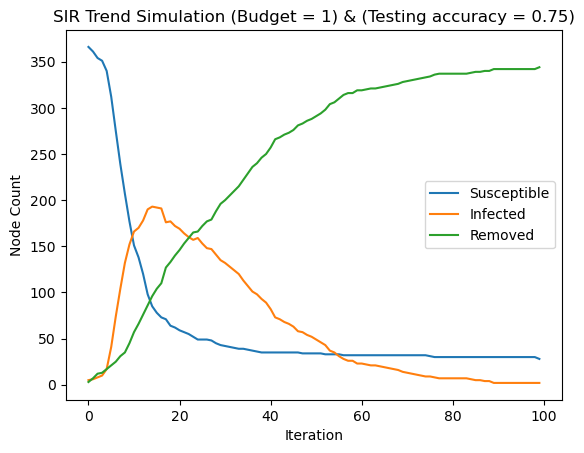

...

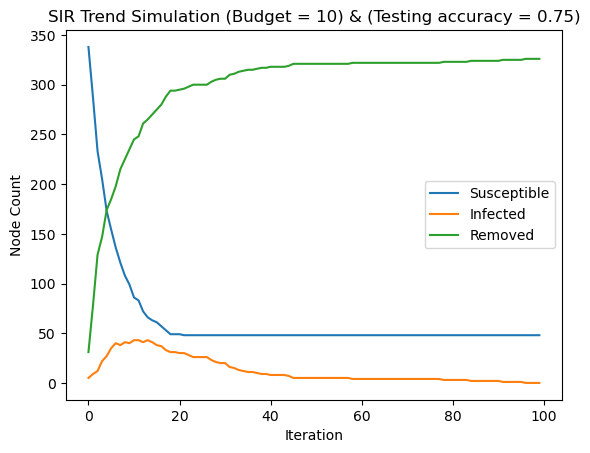

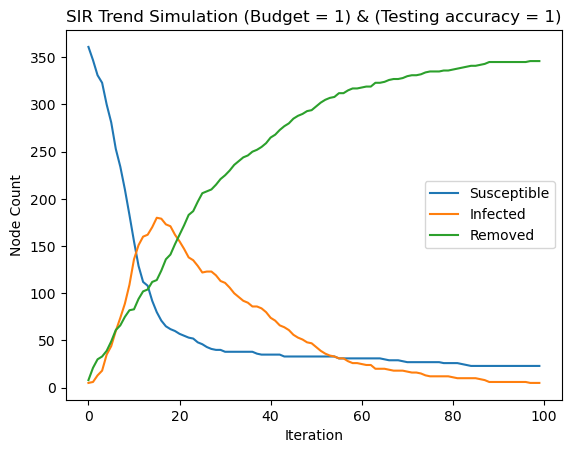

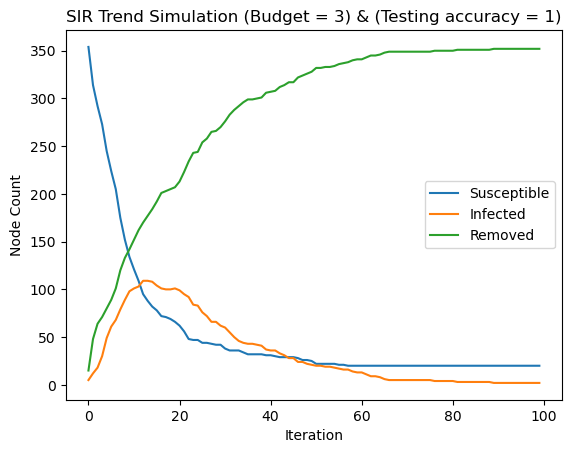

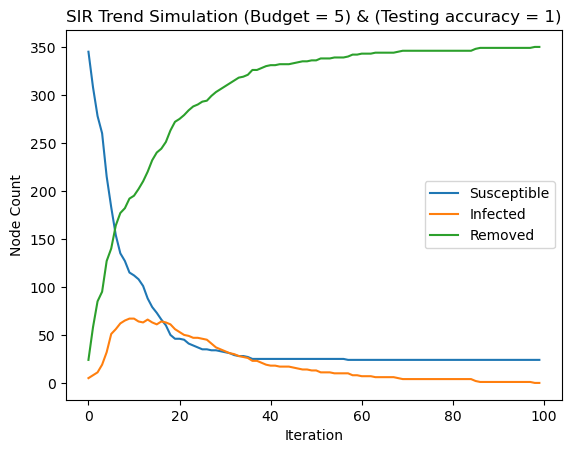

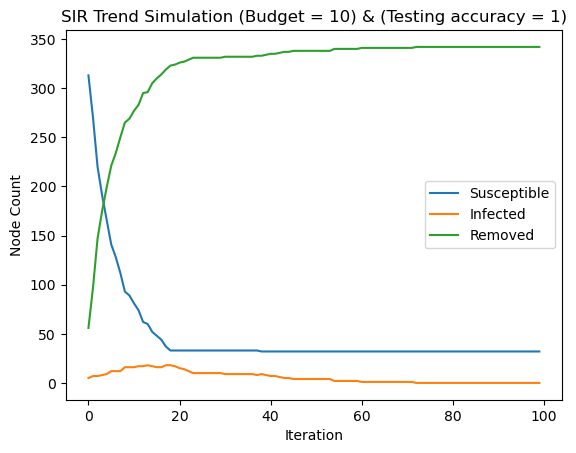

In [57]:
# Maximum vaccination budget
max_vaccinations = 200
timestep_budget = [1, 3, 5, 10]
# Test Accuracy
test_accuracy = [0.5, 0.75, 1]

# different test accuracies
for accuracy in test_accuracy:
    # different budgets
    for budget in timestep_budget:
        # Initialize SIR model again each loop
        sir_model = ep.SIRModel(G)

        # Model Configuration
        config = mc.Configuration()
        config.add_model_parameter('beta', 0.1)
        config.add_model_parameter('gamma', 0.05)

        # Randomly infect 5 nodes
        random_indices = np.random.choice(G.number_of_nodes(), 5, replace=False)
        nodes_to_infect = [list(G.nodes())[i] for i in random_indices]
        config.add_model_initial_configuration("Infected", nodes_to_infect)
        sir_model.set_initial_status(config)

        # Execute the model with vaccination every iteration
        num_iterations = 100
        # Initialize counts 
        counts = {'Susceptible': [], 'Infected': [], 'Removed': []}

        # Tracking vaccination budget used
        current_vaccination = 0
        # Loop for num_iterations
        for i in range(num_iterations):
            # Execute the SIR model for one iteration
            iteration = sir_model.iteration()
            # Apply vaccination at the beginning of each iteration
            if (current_vaccination + budget) < max_vaccinations:
                nodes_to_vaccinate = neighbor_vaccination(G, budget, accuracy, sir_model)  # Vaccinate x nodes 
                current_vaccination += budget # Budget tracker

            # Count the number of nodes in each status
            susceptible_count = 0
            infected_count = 0
            removed_count = 0

            for node in sir_model.status:
                if sir_model.status[node] == 0:
                    susceptible_count += 1
                elif sir_model.status[node] == 1:
                    infected_count += 1
                elif sir_model.status[node] == 2:
                    removed_count += 1

            # Store the counts in the counts dictionary
            counts['Susceptible'].append(susceptible_count)
            counts['Infected'].append(infected_count)
            counts['Removed'].append(removed_count)

        # Plot the trends for this budget
        iterations = range(num_iterations)
        for label, label_counts in counts.items():
            plt.plot(iterations, label_counts, label=label)

        plt.xlabel('Iteration')
        plt.ylabel('Node Count')
        plt.title(f'SIR Trend Simulation (Budget = {budget}) & (Testing accuracy = {accuracy})')
        plt.legend()
        plt.show()